# Generate all synthetc datasets

In [1]:
# Add autoreload magic
%load_ext autoreload
%autoreload 2

In [2]:
# Standard library imports
import logging
import random
# Related third-party imports
import geopandas as gpd
import pandas as pd
import osmnx as ox
import igraph as ig
from shapely.geometry import Point
# Local application/library specific imports
import tripsender.location_assignment as location_assignment
import tripsender.utils as utils
import tripsender.od as od
import tripsender.synthpop as synthpop
import tripsender.io as io
from tripsender.population import Population
from tripsender.building import Building, PreferredLocations
from tripsender.sequencer import process_activity_sequence, assign_activity_sequence_to_synthetic_population
from tripsender.person import Person
from tripsender.routing import NetworkRoutingComputer, TransitMatrixComputer,compute_routes_for_all_buildings
from tripsender.activity import plot_activity_engagement, plot_amenity_demand

c:\Users\ssanjay\AppData\Local\Continuum\anaconda3\envs\tripsender\lib\site-packages\geopandas\_compat.py:124: UserWarning: The Shapely GEOS version (3.11.2-CAPI-1.17.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\ssanjay\AppData\Local\Temp\ipykernel_20904\614140090.py:5: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this

## Initialise population and assign destinations

In [3]:
# Initialise all routing computers
nrc_drive = NetworkRoutingComputer('drive')
nrc_bike = NetworkRoutingComputer('bike')
nrc_walk = NetworkRoutingComputer('walk')
nrc_transit = TransitMatrixComputer()

# Initialise the Job density calculation
# Compute job densities
gdf_jobs = location_assignment.compute_job_density(file_path="data/processed/jobs.shp", radius=500)

# Process the activity sequence
process_activity_sequence()

2024-05-14 12:26:17 - tripsender.io - INFO - Loading drive networkx graph...
2024-05-14 12:26:24 - tripsender.io - INFO - Converting drive networkx graph to igraph...
2024-05-14 12:26:24 - tripsender.routing - INFO - Computing lengths of geometries...
2024-05-14 12:26:24 - tripsender.io - INFO - Loading bike networkx graph...
2024-05-14 12:26:46 - tripsender.io - INFO - Converting bike networkx graph to igraph...
2024-05-14 12:26:49 - tripsender.routing - INFO - Computing lengths of geometries...
2024-05-14 12:26:49 - tripsender.io - INFO - Loading walk networkx graph...
2024-05-14 12:27:32 - tripsender.io - INFO - Converting walk networkx graph to igraph...
2024-05-14 12:27:37 - tripsender.routing - INFO - Computing lengths of geometries...
2024-05-14 12:28:16 - tripsender.location_assignment - INFO - Computing job densities...
2024-05-14 12:28:22 - tripsender.sequencer - INFO - Starting activity sequence assignment...
c:\Users\ssanjay\AppData\Local\Continuum\anaconda3\envs\tripsender

In [4]:
# area_names "data/primary_area.csv"
areas_df = pd.read_csv("data/primary_area.csv")
primary_areas = areas_df['primary_area'].tolist()
year = 2019

In [7]:
areas_df

,primary_area
0,101 Kungsladugård
1,102 Sanna
2,103 Majorna
3,104 Stigberget
4,105 Masthugget
...,...
91,705 Nolered
92,706 Björlanda
93,707 Arendal
94,708 Södra Biskopsgården


2024-05-15 10:06:23 - tripsender.population - INFO - Initializing Population object for year 2019 and area 517 Frölunda Torg
2024-05-15 10:06:25 - tripsender.population - INFO - [{'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['232']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['517 Frölunda Torg', '0-5 år', 'Kvinnor', 'Person i gift par/regi

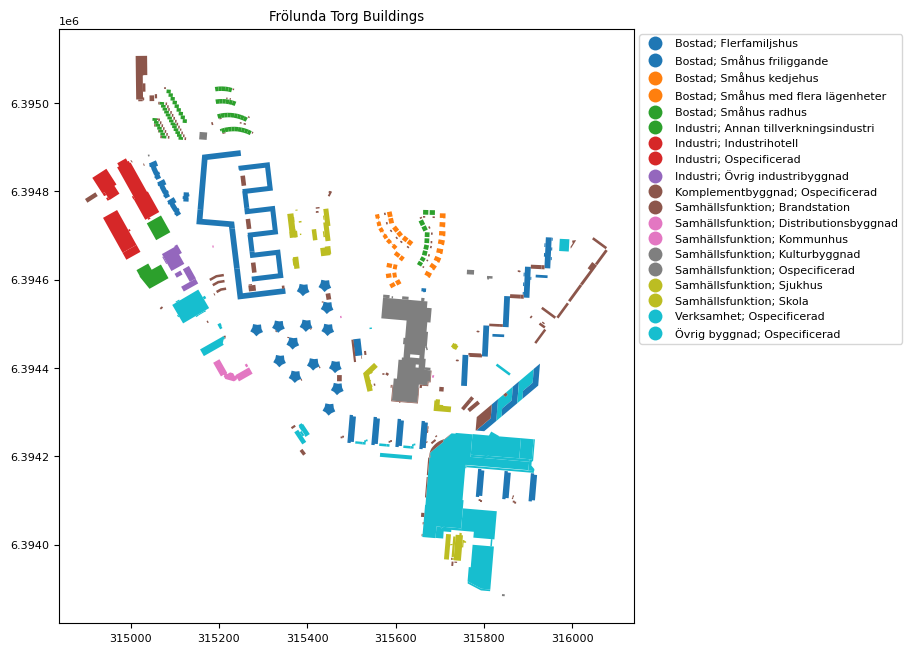

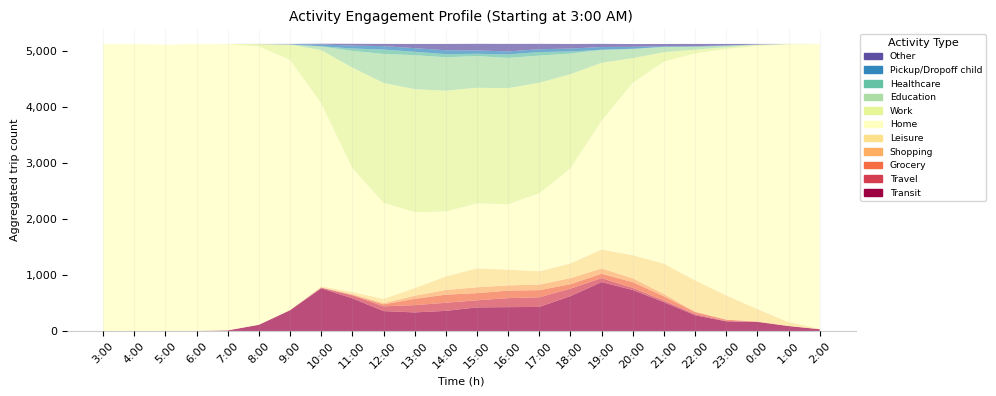

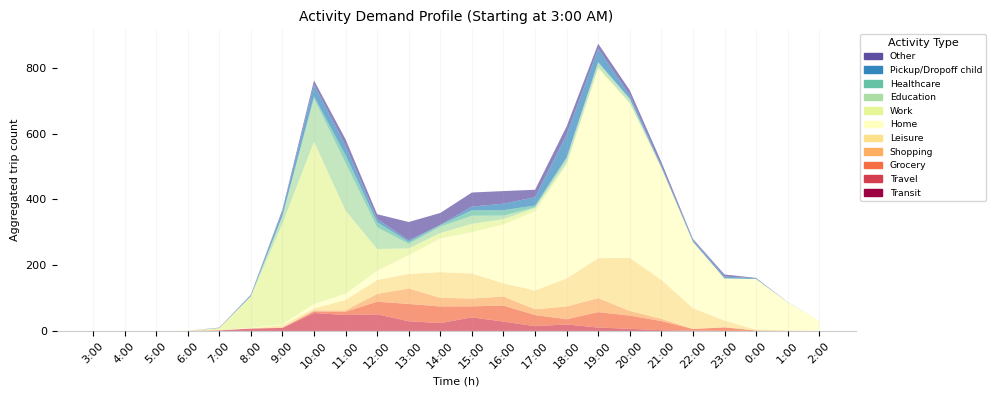

2024-05-15 10:10:07 - tripsender.population - INFO - Initializing Population object for year 2019 and area 518 Ängås
2024-05-15 10:10:07 - tripsender.population - INFO - [{'key': ['518 Ängås', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['162']}, {'key': ['518 Ängås', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['518 Ängås', '

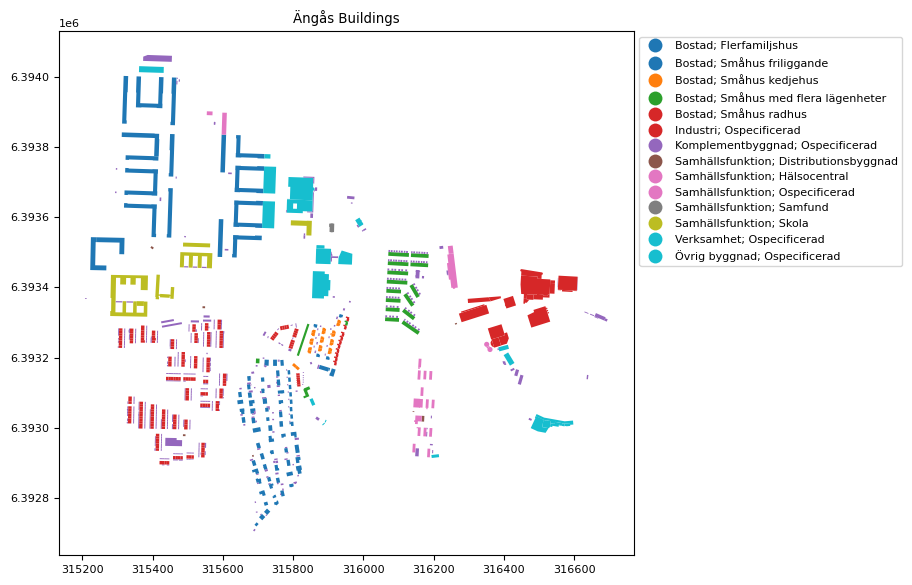

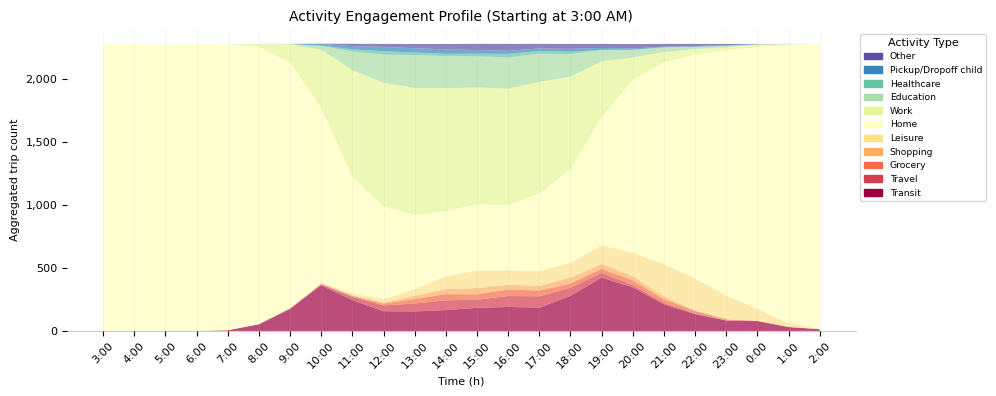

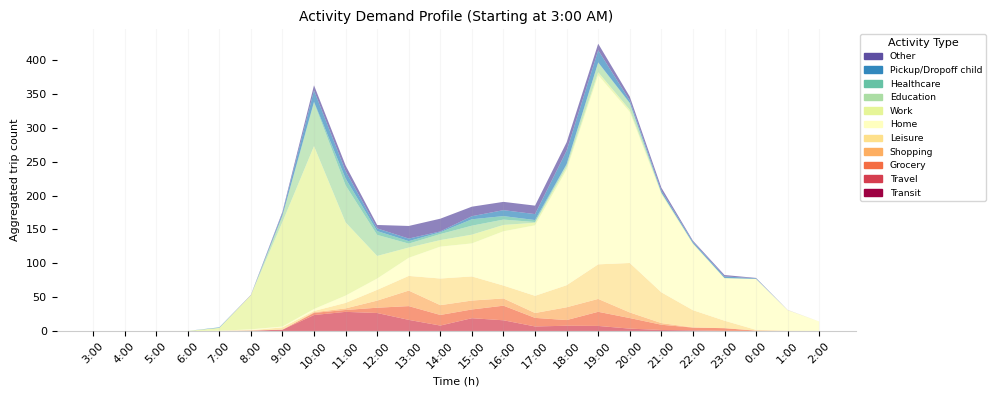

2024-05-15 10:12:13 - tripsender.population - INFO - Initializing Population object for year 2019 and area 519 Önnered
2024-05-15 10:12:13 - tripsender.population - INFO - [{'key': ['519 Önnered', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['519 Önnered', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['519 Önnered', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['519 Önnered', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['129']}, {'key': ['519 Önnered', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['519 Önnered', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['519 Önnered', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['519 Önnered', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key

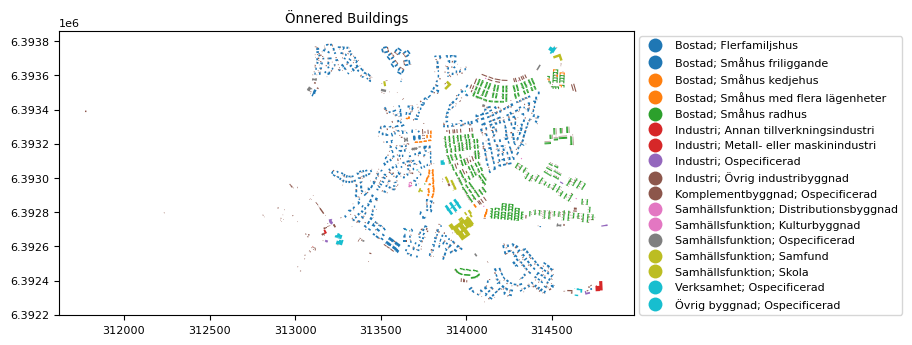

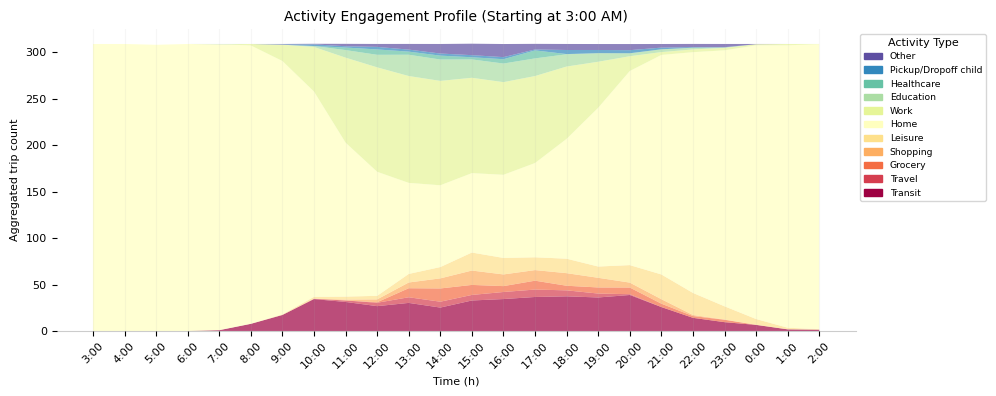

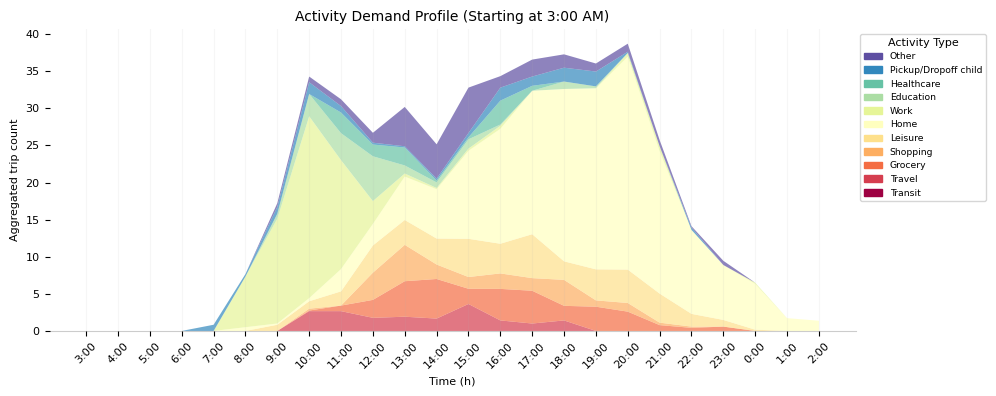

2024-05-15 10:13:30 - tripsender.population - INFO - Initializing Population object for year 2019 and area 520 Grevegården
2024-05-15 10:13:30 - tripsender.population - INFO - [{'key': ['520 Grevegården', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['520 Grevegården', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['520 Grevegården', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['520 Grevegården', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['208']}, {'key': ['520 Grevegården', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['520 Grevegården', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['520 Grevegården', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['520 Grevegården', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerska

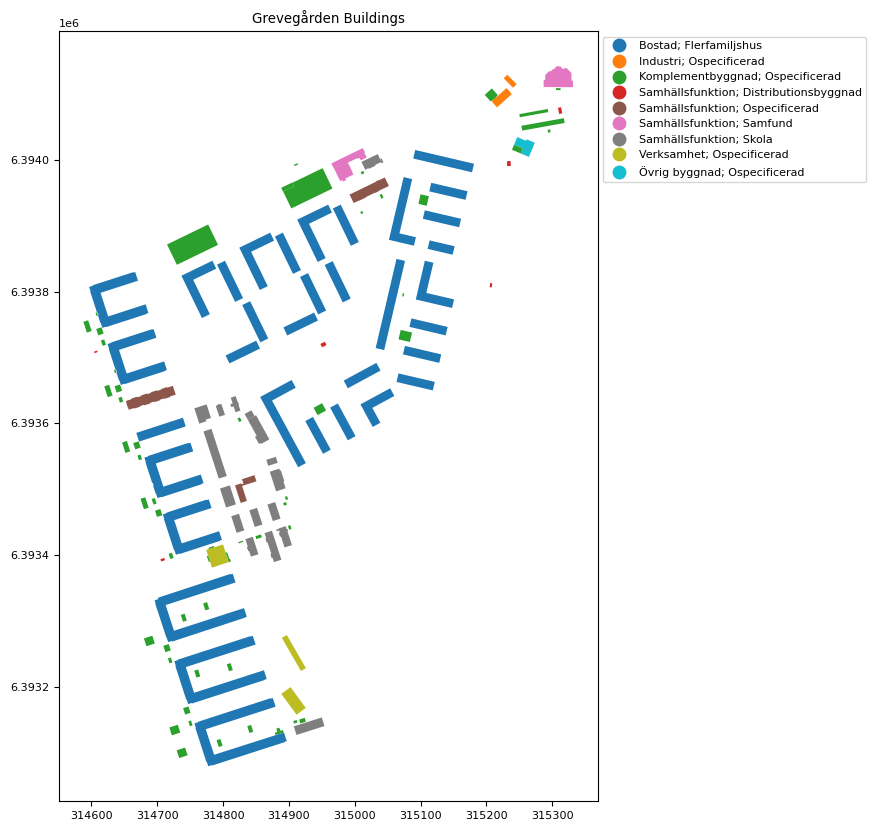

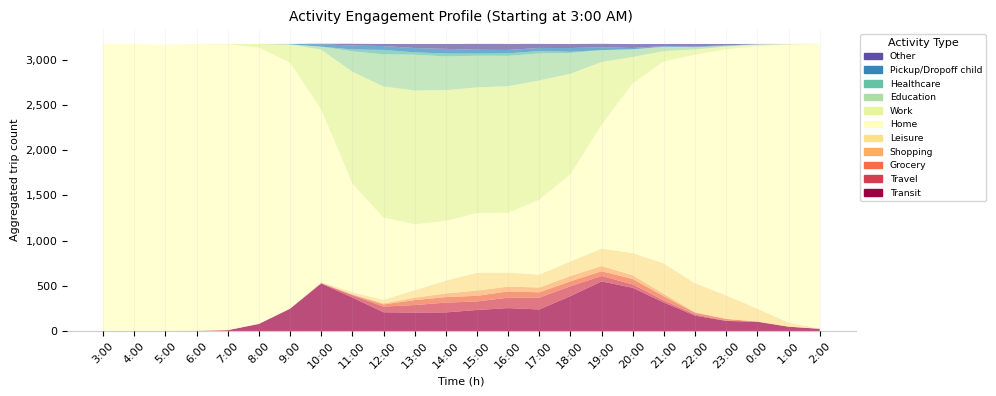

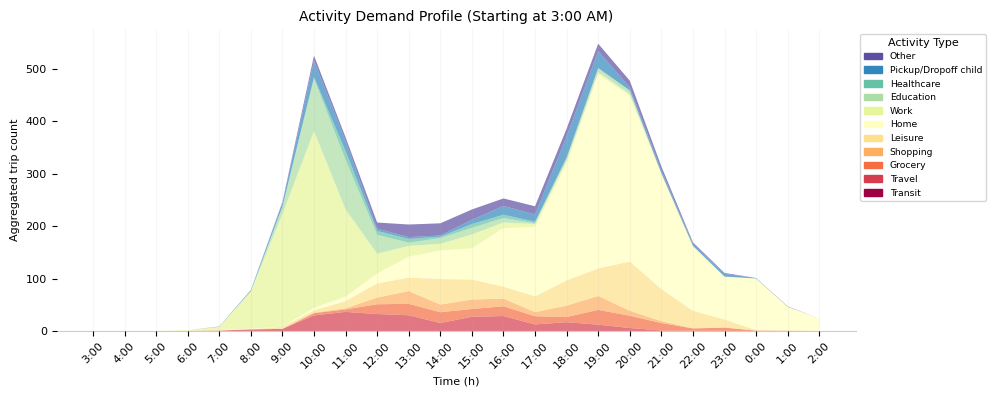

2024-05-15 10:15:58 - tripsender.population - INFO - Initializing Population object for year 2019 and area 521 Näset
2024-05-15 10:15:58 - tripsender.population - INFO - [{'key': ['521 Näset', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['521 Näset', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['521 Näset', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['521 Näset', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['226']}, {'key': ['521 Näset', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['521 Näset', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['521 Näset', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['521 Näset', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['521 Näset', '

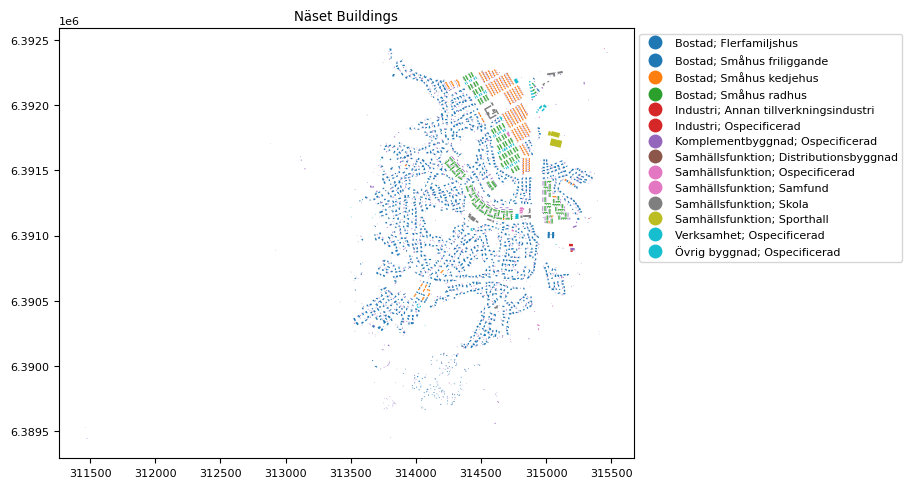

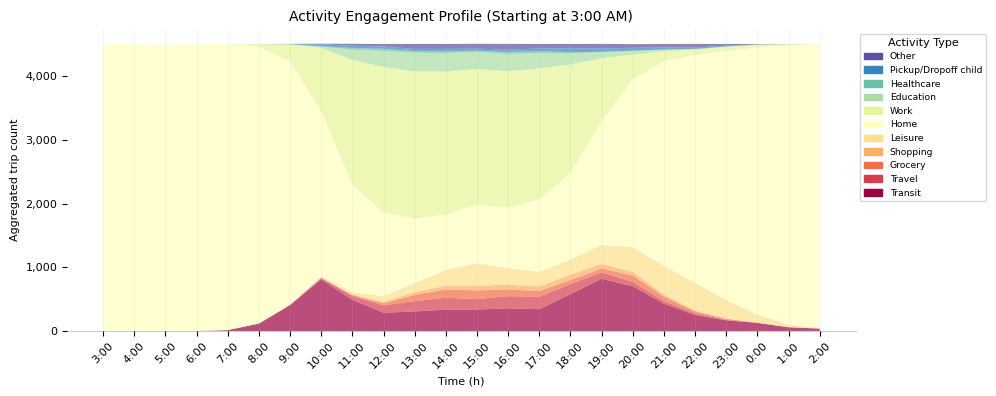

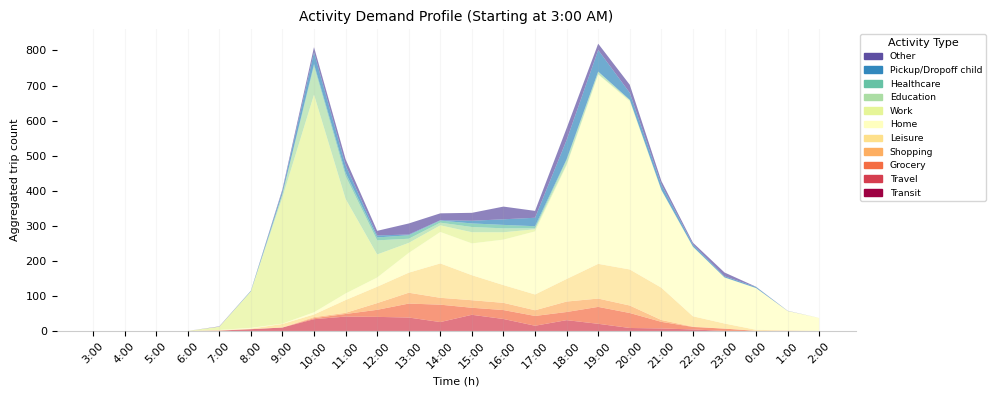

2024-05-15 10:20:06 - tripsender.population - INFO - Initializing Population object for year 2019 and area 522 Kannebäck
2024-05-15 10:20:06 - tripsender.population - INFO - [{'key': ['522 Kannebäck', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['522 Kannebäck', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['522 Kannebäck', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['522 Kannebäck', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['134']}, {'key': ['522 Kannebäck', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['522 Kannebäck', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['522 Kannebäck', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['522 Kannebäck', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'valu

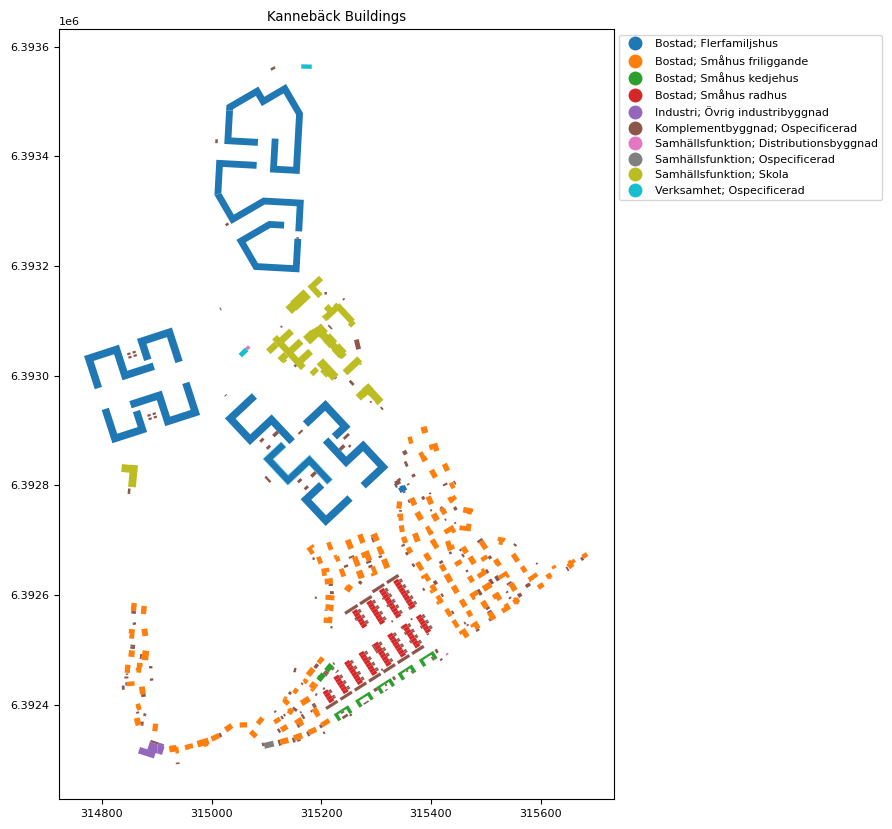

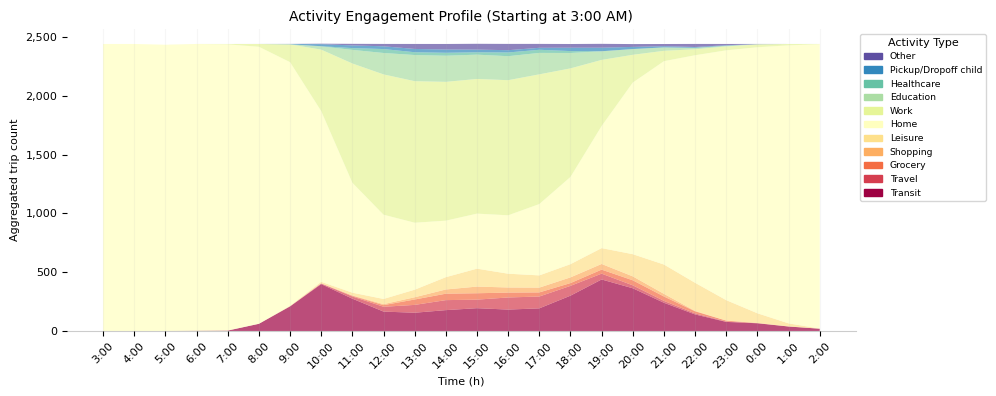

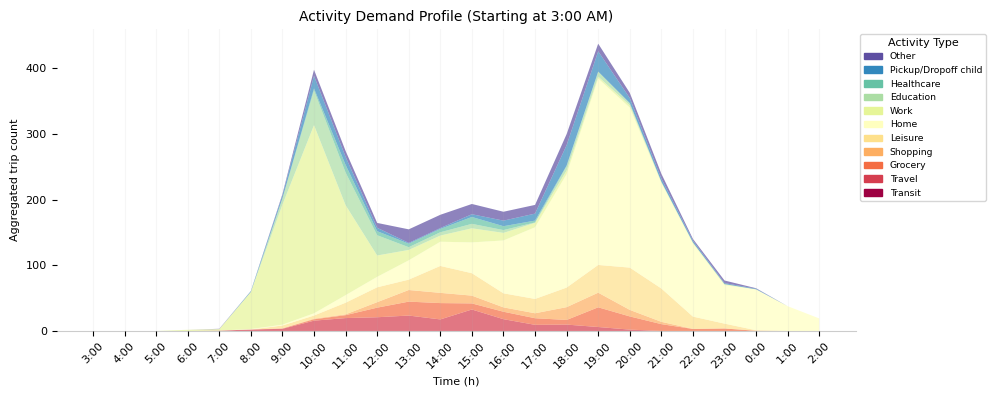

2024-05-15 10:22:09 - tripsender.population - INFO - Initializing Population object for year 2019 and area 523 Askim
2024-05-15 10:22:09 - tripsender.population - INFO - [{'key': ['523 Askim', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['523 Askim', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['523 Askim', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['523 Askim', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['423']}, {'key': ['523 Askim', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['523 Askim', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['523 Askim', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['523 Askim', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['523 Askim', '

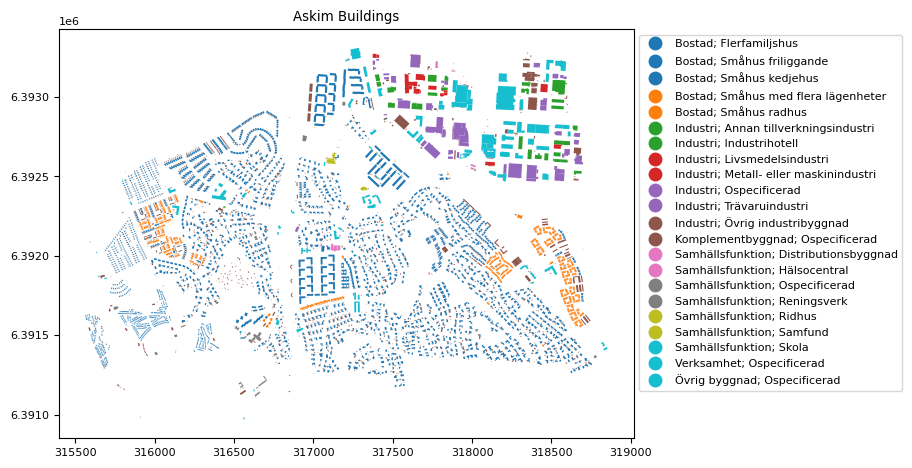

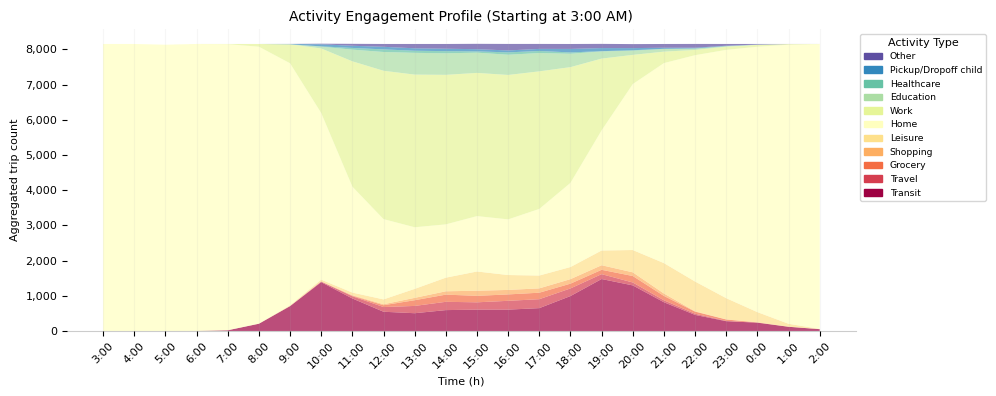

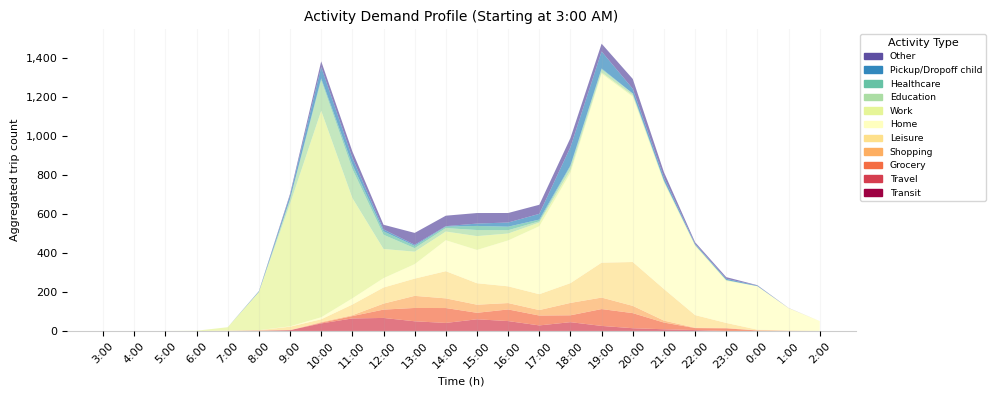

2024-05-15 10:28:45 - tripsender.population - INFO - Initializing Population object for year 2019 and area 524 Hovås
2024-05-15 10:28:45 - tripsender.population - INFO - [{'key': ['524 Hovås', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['110']}, {'key': ['524 Hovås', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['524 Hovås', '

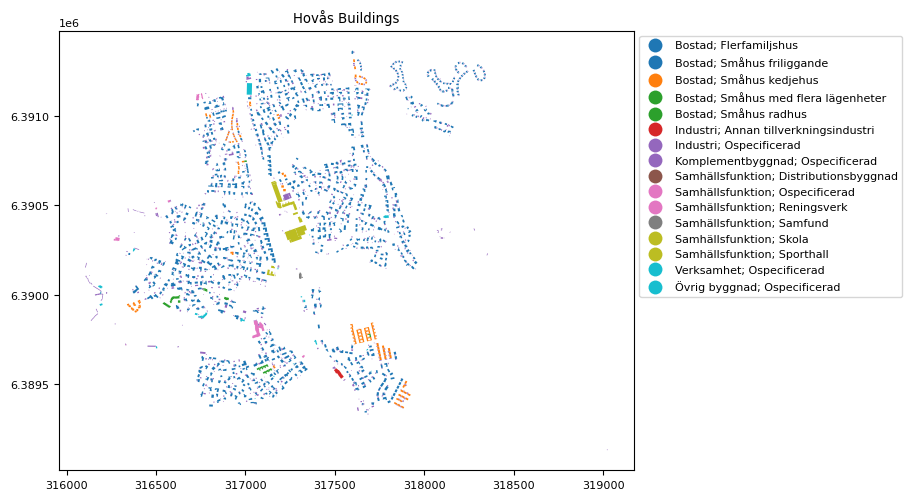

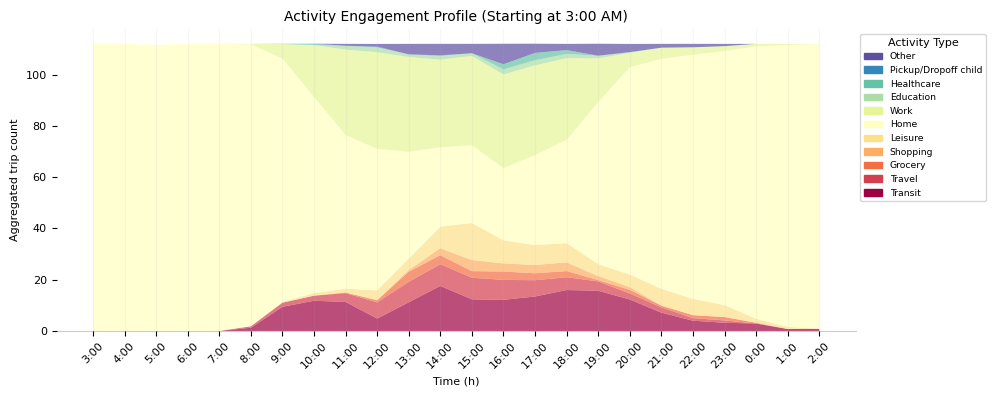

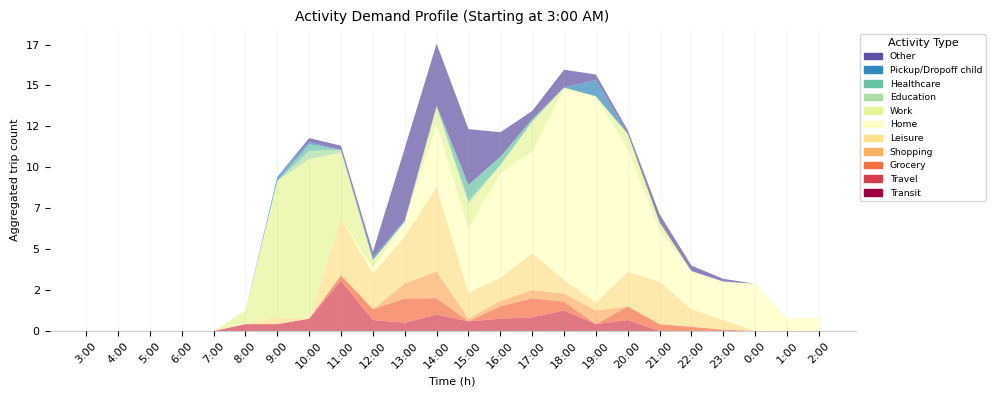

2024-05-15 10:29:44 - tripsender.population - INFO - Initializing Population object for year 2019 and area 525 Billdal
2024-05-15 10:29:44 - tripsender.population - INFO - [{'key': ['525 Billdal', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['525 Billdal', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['525 Billdal', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['525 Billdal', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['598']}, {'key': ['525 Billdal', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['525 Billdal', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['525 Billdal', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['525 Billdal', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key

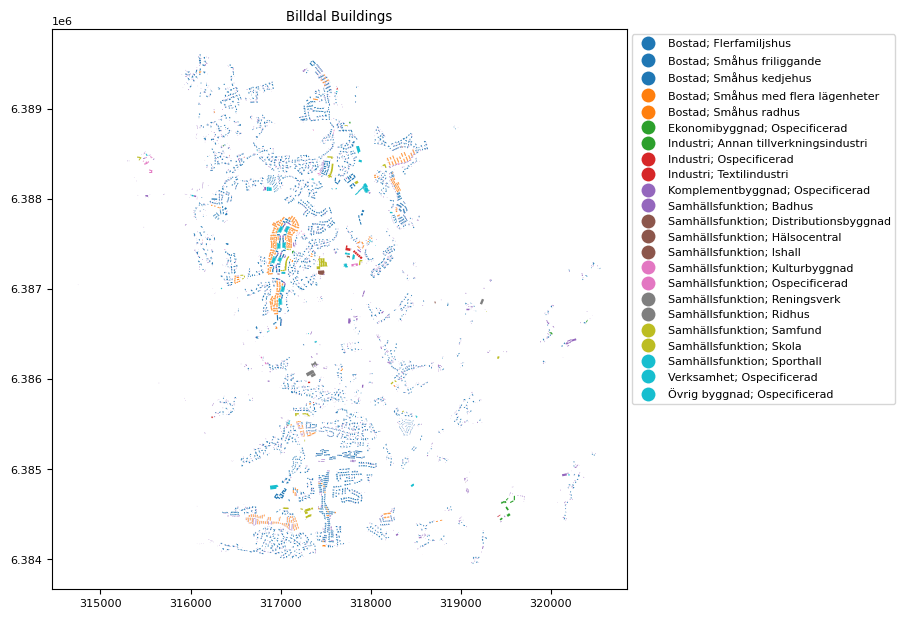

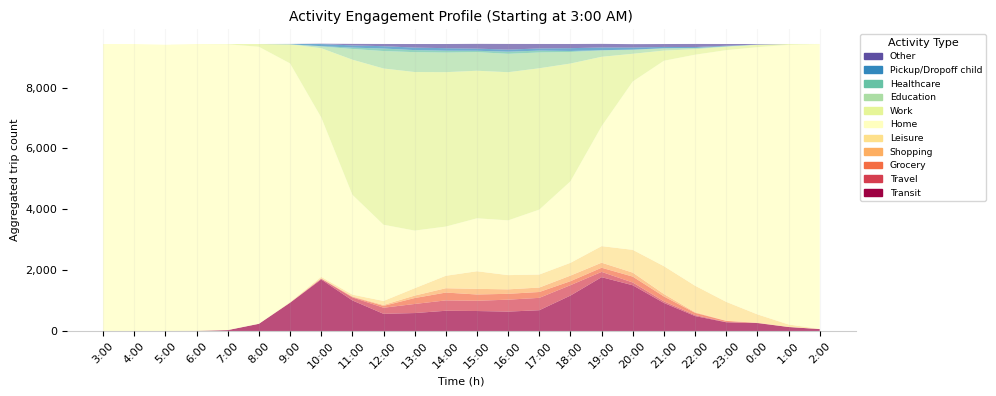

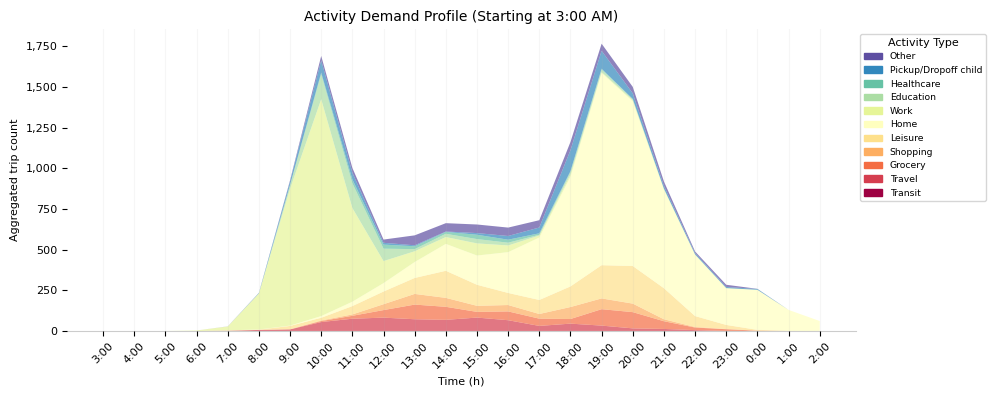

2024-05-15 10:37:51 - tripsender.population - INFO - Initializing Population object for year 2019 and area 601 Lövgärdet
2024-05-15 10:37:51 - tripsender.population - INFO - [{'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['462']}, {'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['601 Lövgärdet', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['601 Lövgärdet', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'valu

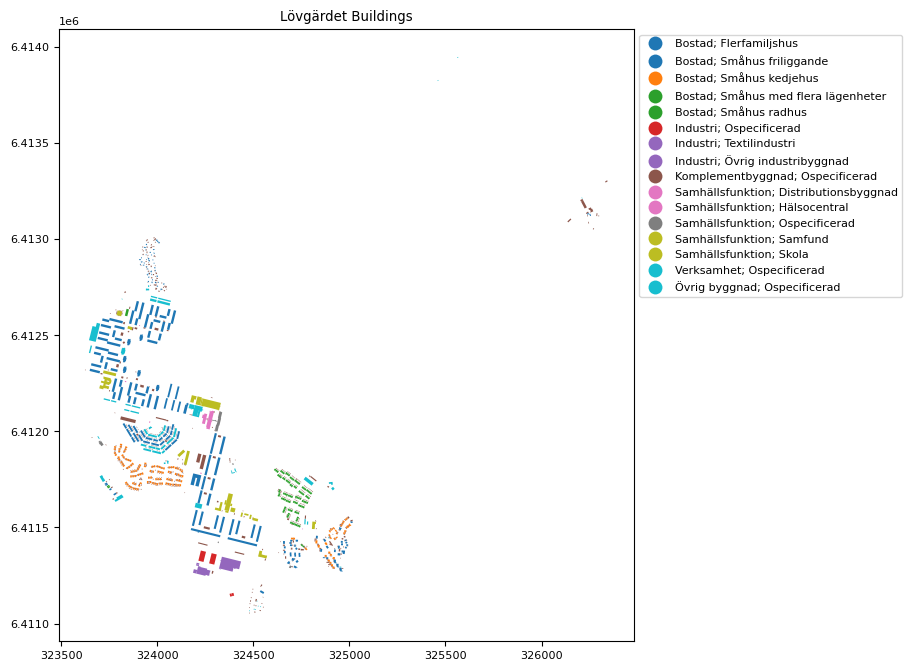

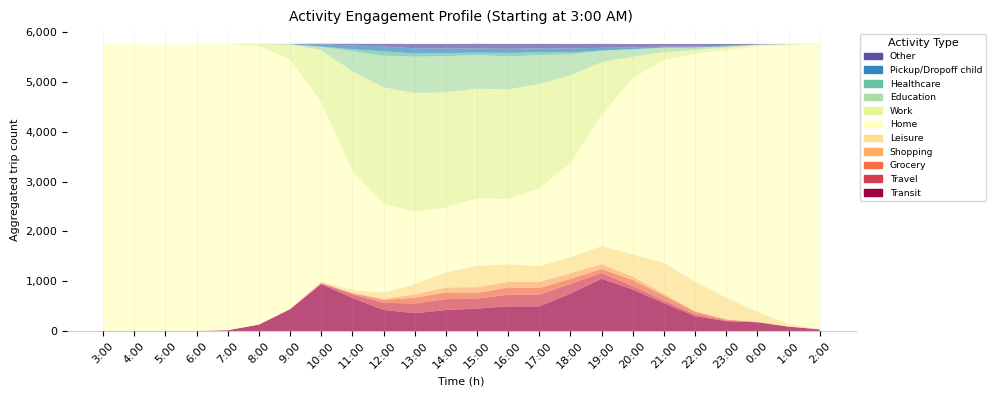

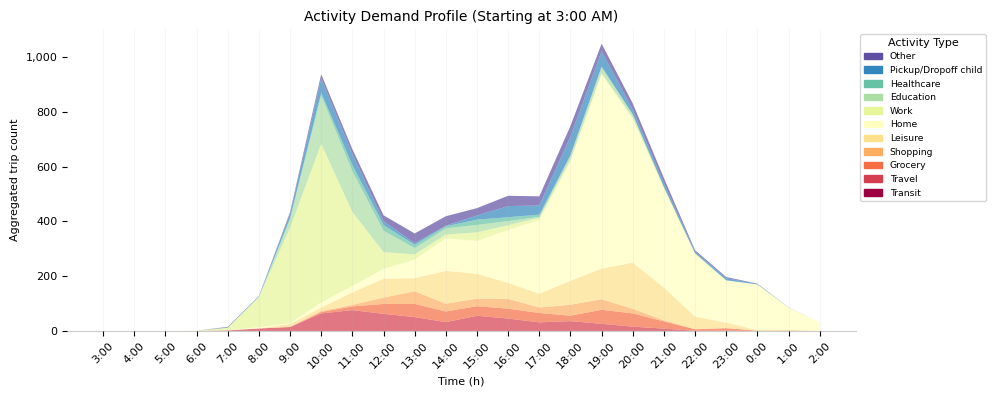

2024-05-15 11:09:29 - tripsender.population - INFO - Initializing Population object for year 2019 and area 602 Rannebergen
2024-05-15 11:09:29 - tripsender.population - INFO - [{'key': ['602 Rannebergen', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['602 Rannebergen', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['602 Rannebergen', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['602 Rannebergen', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['254']}, {'key': ['602 Rannebergen', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['602 Rannebergen', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['602 Rannebergen', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['602 Rannebergen', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerska

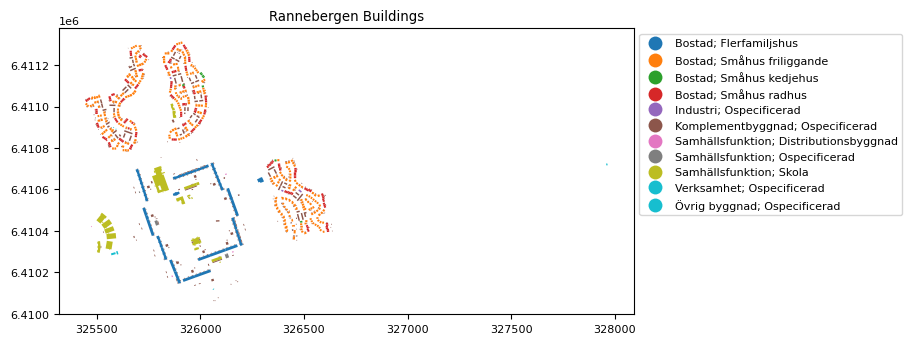

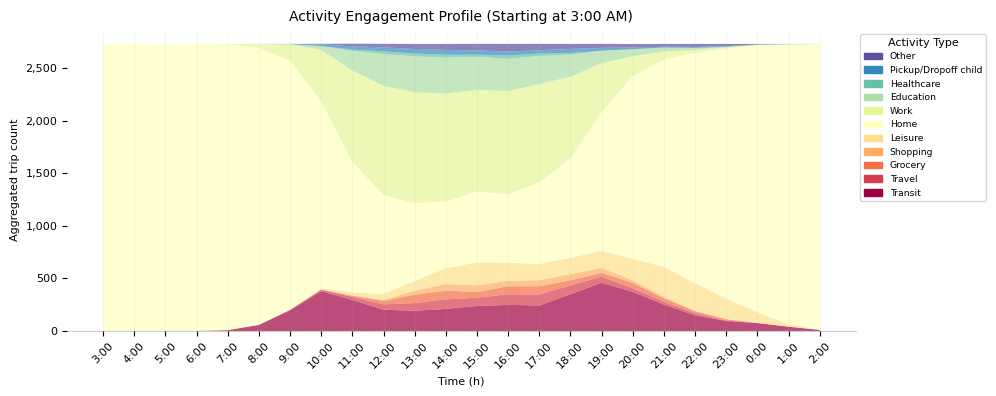

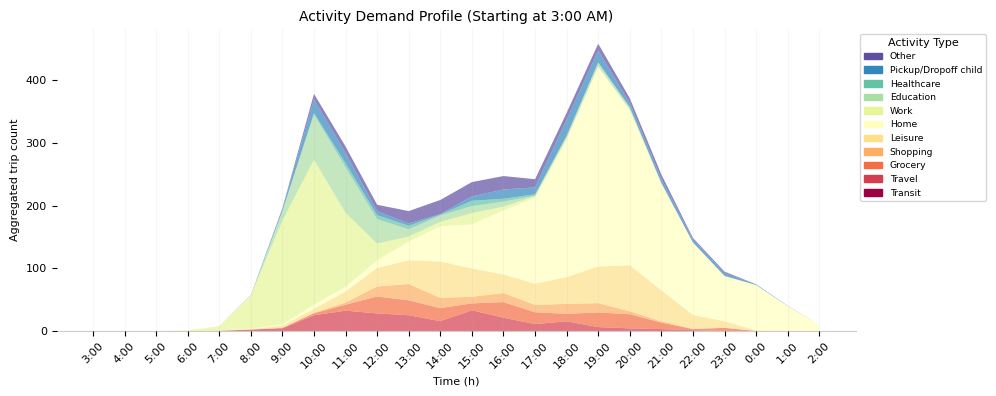

2024-05-15 11:11:51 - tripsender.population - INFO - Initializing Population object for year 2019 and area 603 Gårdstensberget
2024-05-15 11:11:52 - tripsender.population - INFO - [{'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['454']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['603 Gårdstensberget', '0-5 år', 'Kvinnor', 'Pers

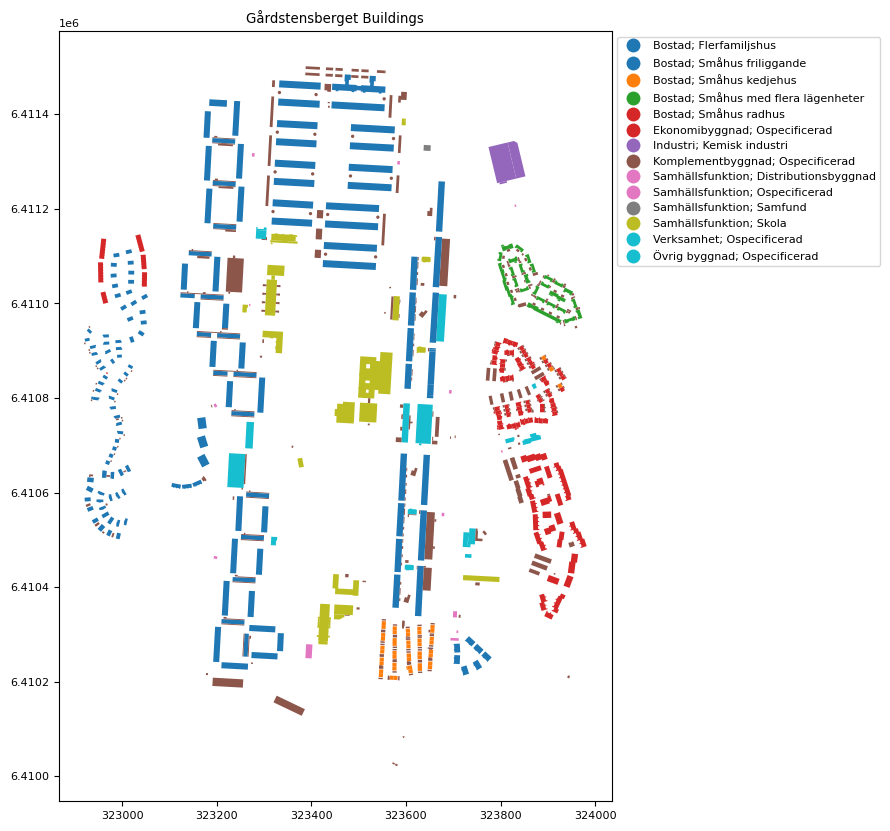

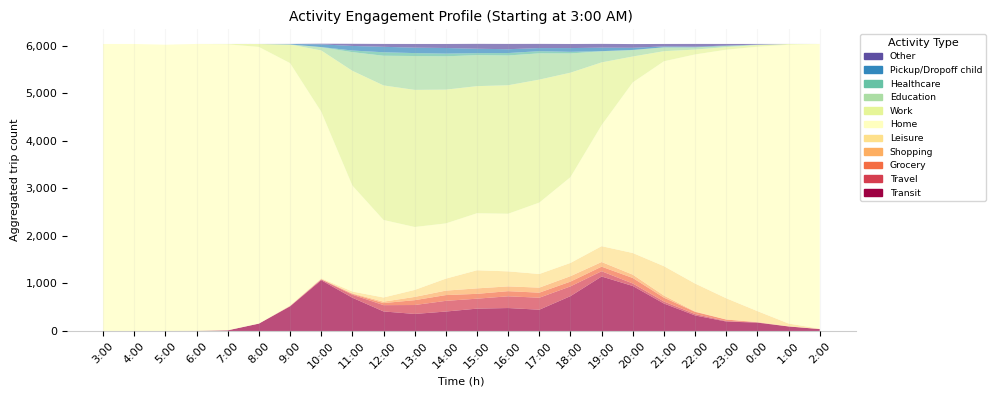

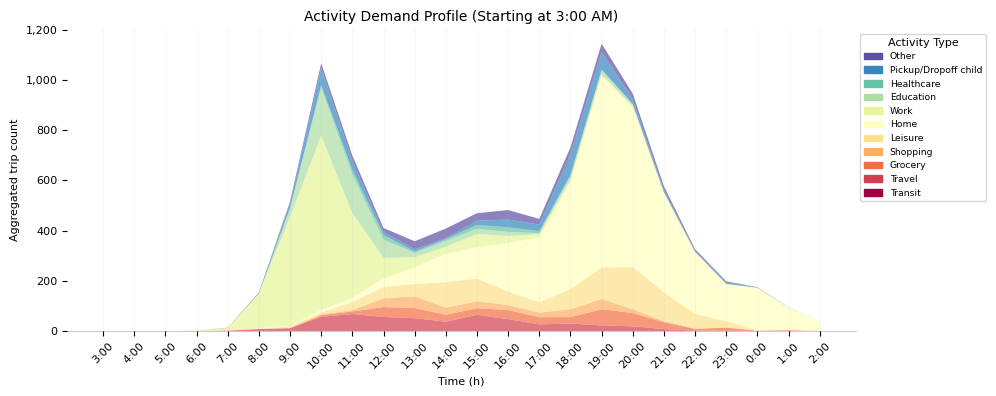

2024-05-15 11:16:30 - tripsender.population - INFO - Initializing Population object for year 2019 and area 604 Angereds Centrum
2024-05-15 11:16:31 - tripsender.population - INFO - [{'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['131']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['604 Angereds Centrum', '0-5 år', 'Kvinno

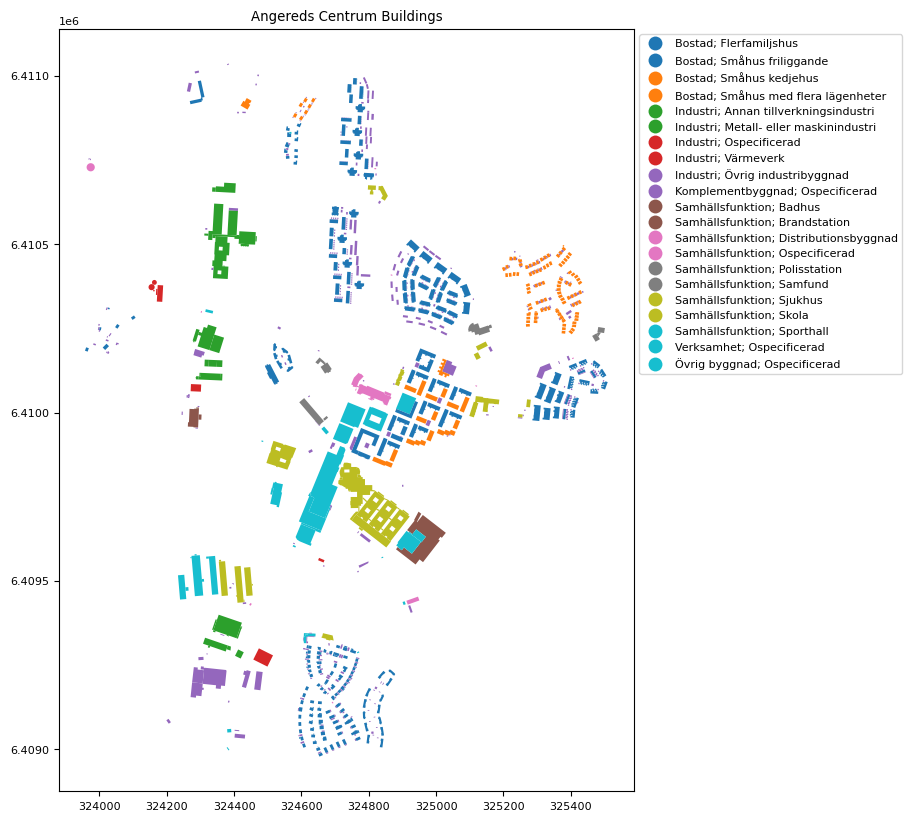

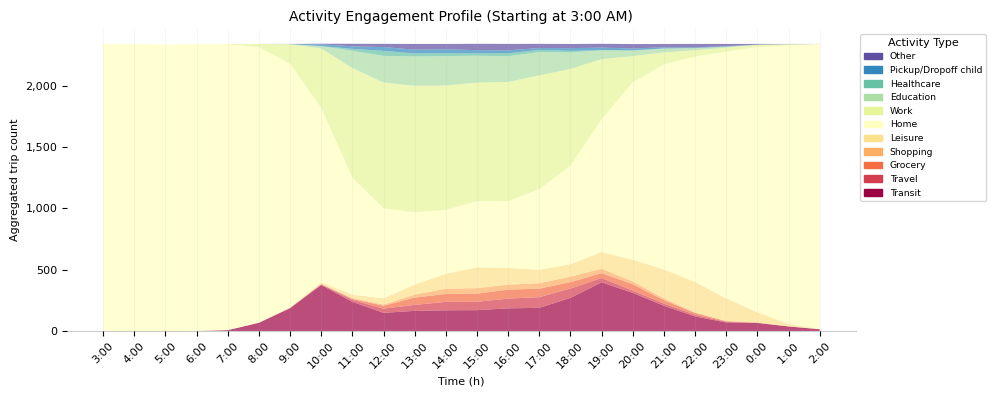

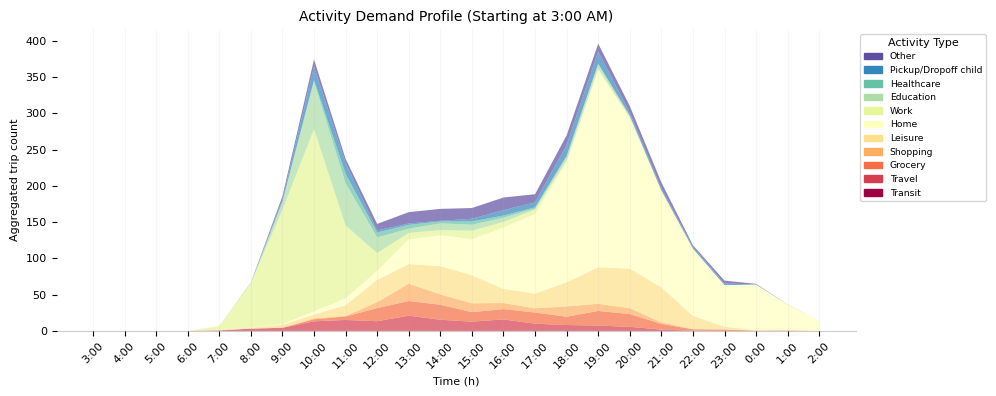

2024-05-15 11:18:22 - tripsender.population - INFO - Initializing Population object for year 2019 and area 605 Agnesberg
2024-05-15 11:18:22 - tripsender.population - INFO - [{'key': ['605 Agnesberg', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['605 Agnesberg', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['605 Agnesberg', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['605 Agnesberg', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['50']}, {'key': ['605 Agnesberg', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['605 Agnesberg', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['605 Agnesberg', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['605 Agnesberg', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'value

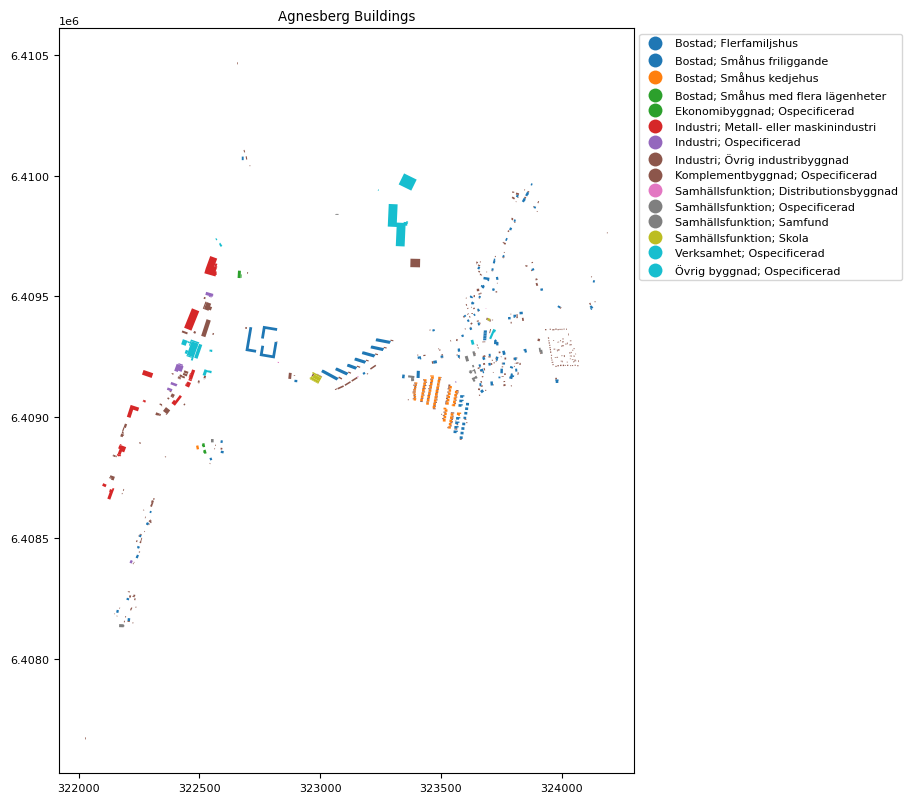

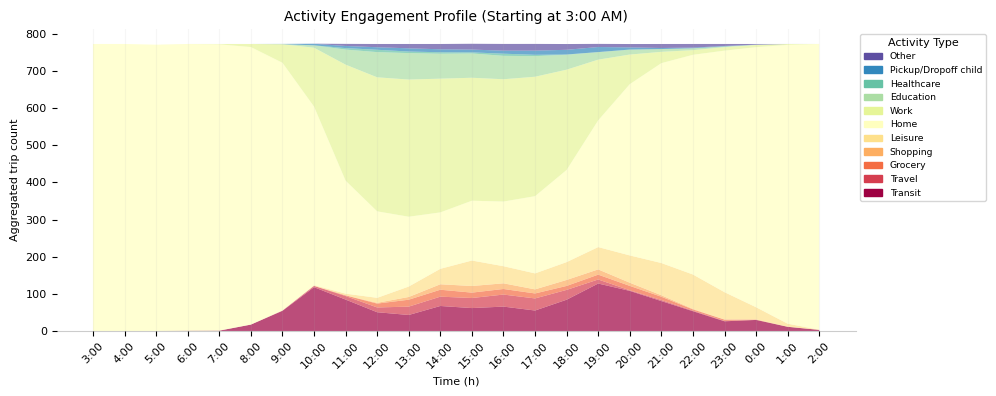

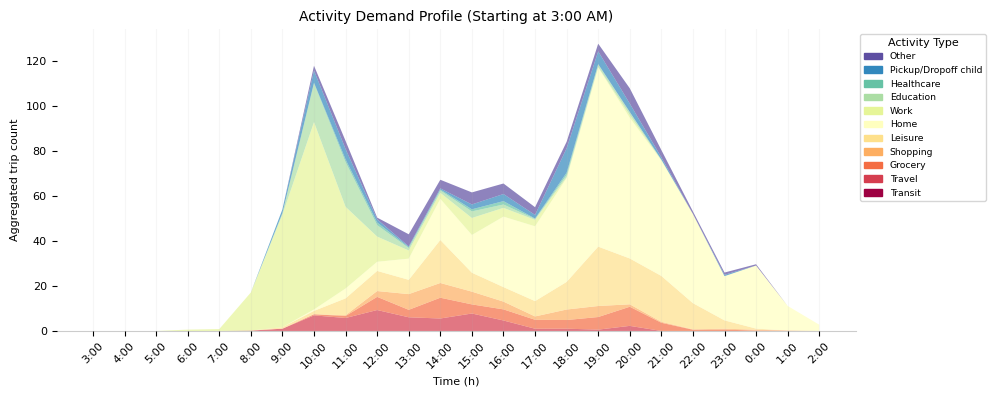

2024-05-15 11:19:03 - tripsender.population - INFO - Initializing Population object for year 2019 and area 606 Hammarkullen
2024-05-15 11:19:03 - tripsender.population - INFO - [{'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['423']}, {'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['606 Hammarkullen', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['606 Hammarkullen', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat p

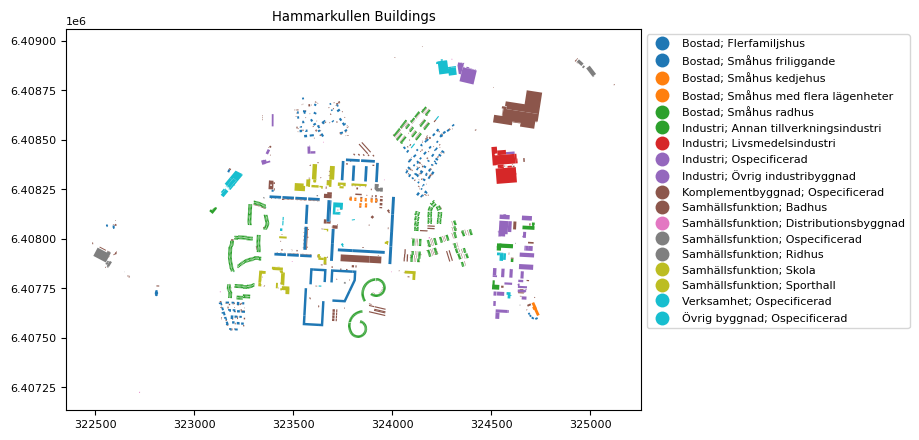

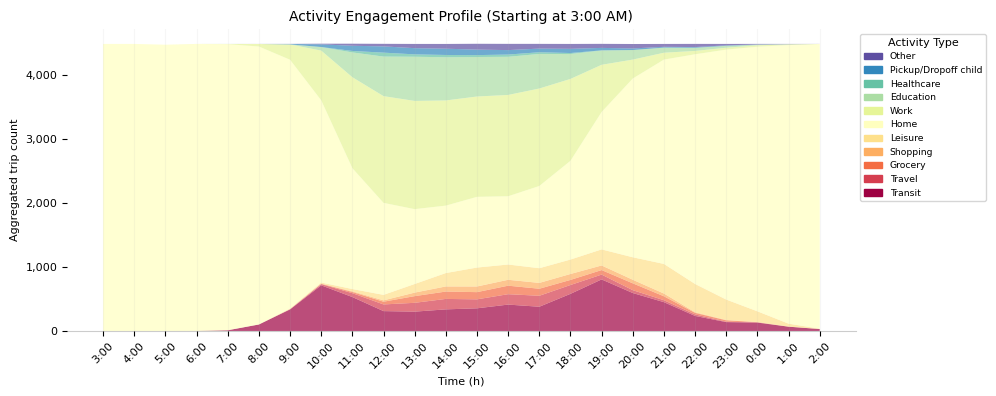

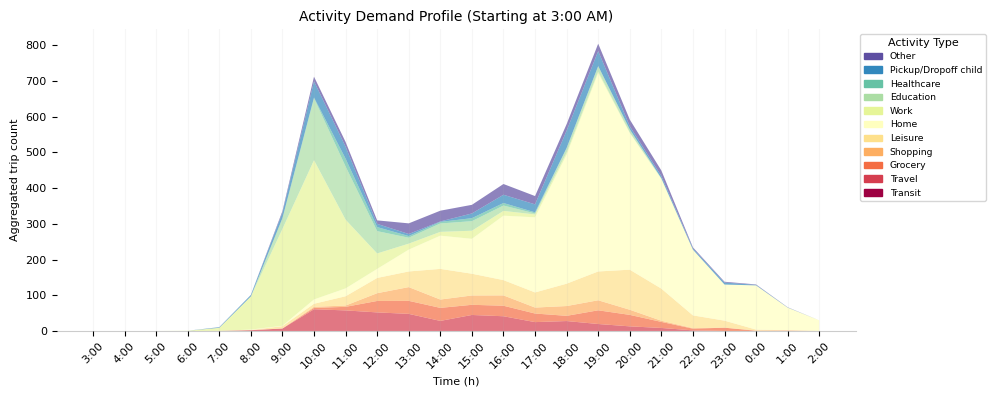

2024-05-15 11:22:47 - tripsender.population - INFO - Initializing Population object for year 2019 and area 609 Linnarhult
2024-05-15 11:22:47 - tripsender.population - INFO - [{'key': ['609 Linnarhult', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['609 Linnarhult', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['609 Linnarhult', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['609 Linnarhult', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['18']}, {'key': ['609 Linnarhult', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['609 Linnarhult', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['609 Linnarhult', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['609 Linnarhult', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'

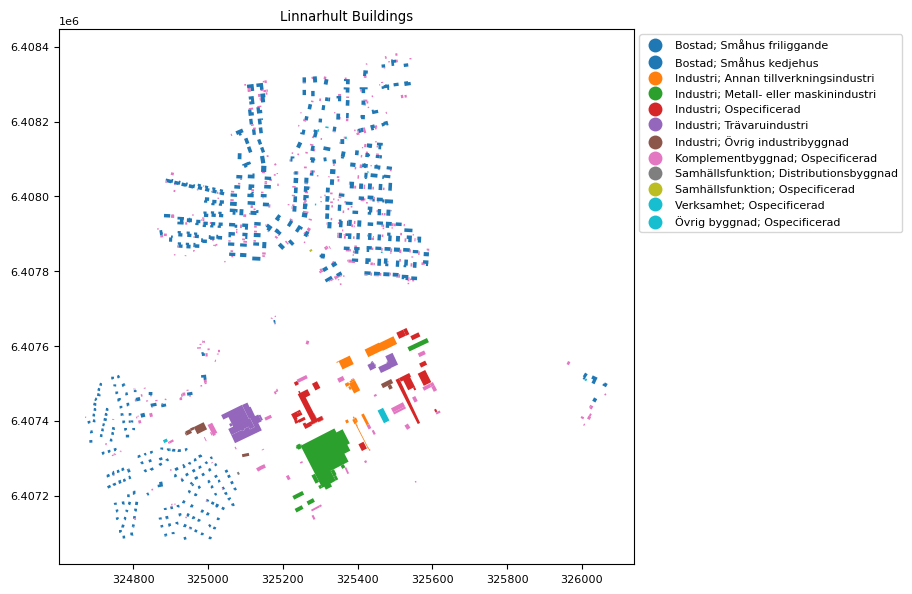

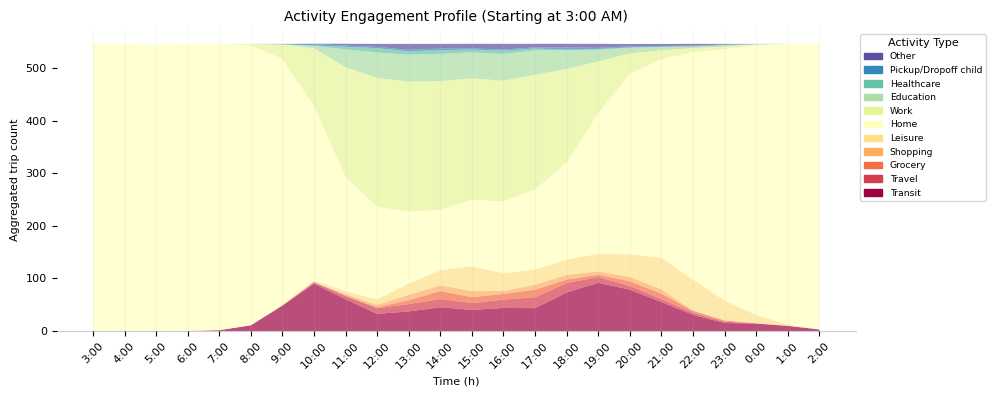

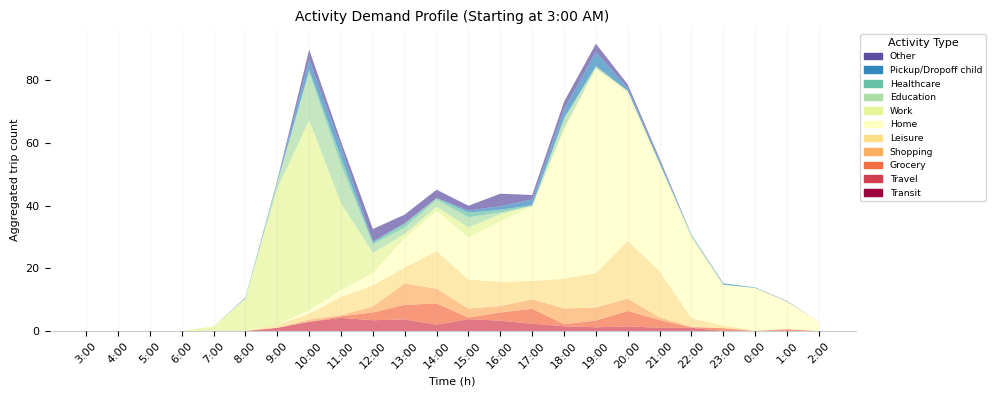

2024-05-15 11:23:18 - tripsender.population - INFO - Initializing Population object for year 2019 and area 610 Gunnilse
2024-05-15 11:23:18 - tripsender.population - INFO - [{'key': ['610 Gunnilse', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['610 Gunnilse', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['610 Gunnilse', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['610 Gunnilse', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['82']}, {'key': ['610 Gunnilse', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['610 Gunnilse', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['610 Gunnilse', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['610 Gunnilse', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']

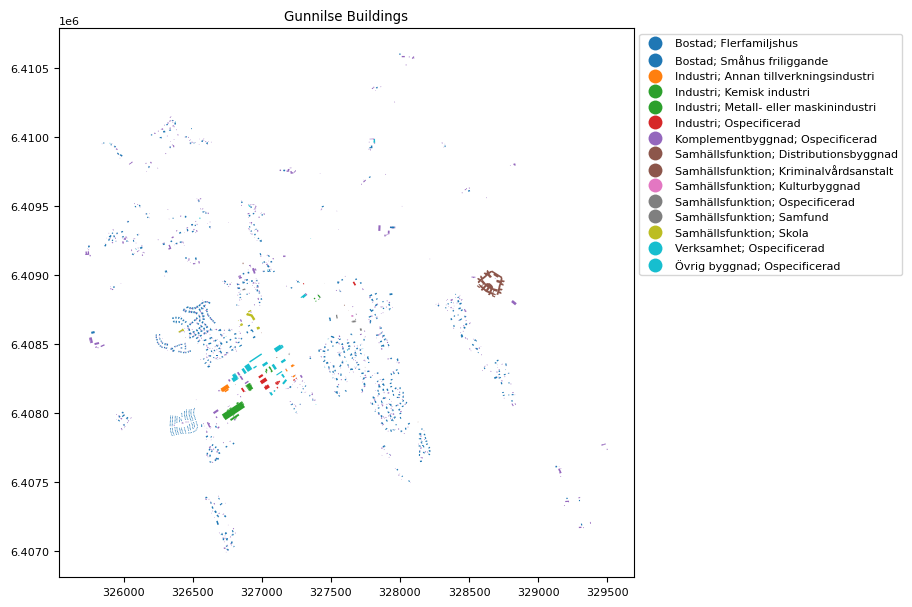

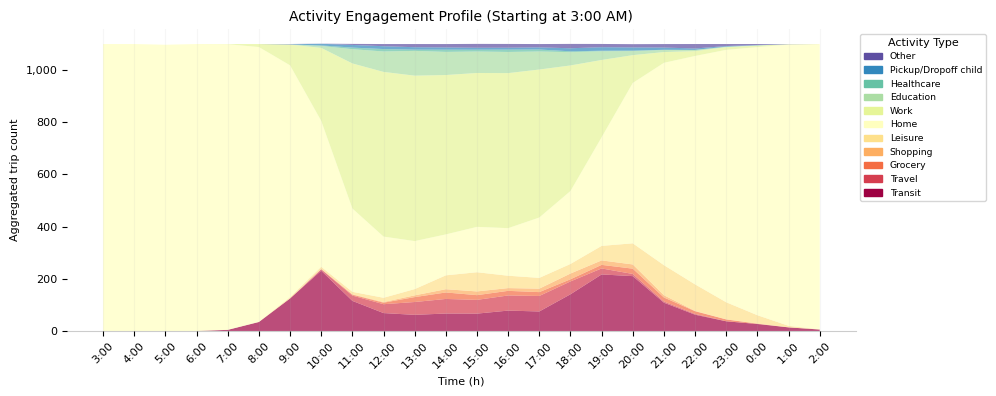

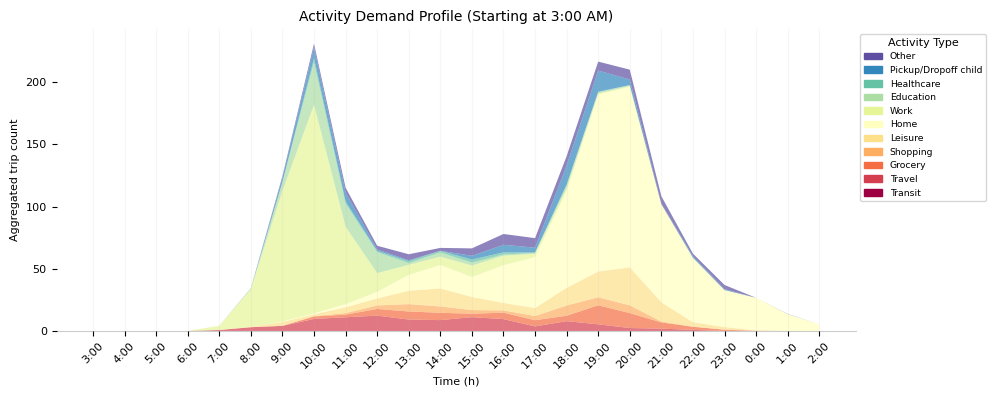

2024-05-15 11:24:12 - tripsender.population - INFO - Initializing Population object for year 2019 and area 611 Bergum
2024-05-15 11:24:12 - tripsender.population - INFO - [{'key': ['611 Bergum', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['611 Bergum', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['611 Bergum', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['611 Bergum', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['212']}, {'key': ['611 Bergum', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['611 Bergum', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['611 Bergum', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['611 Bergum', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['611 

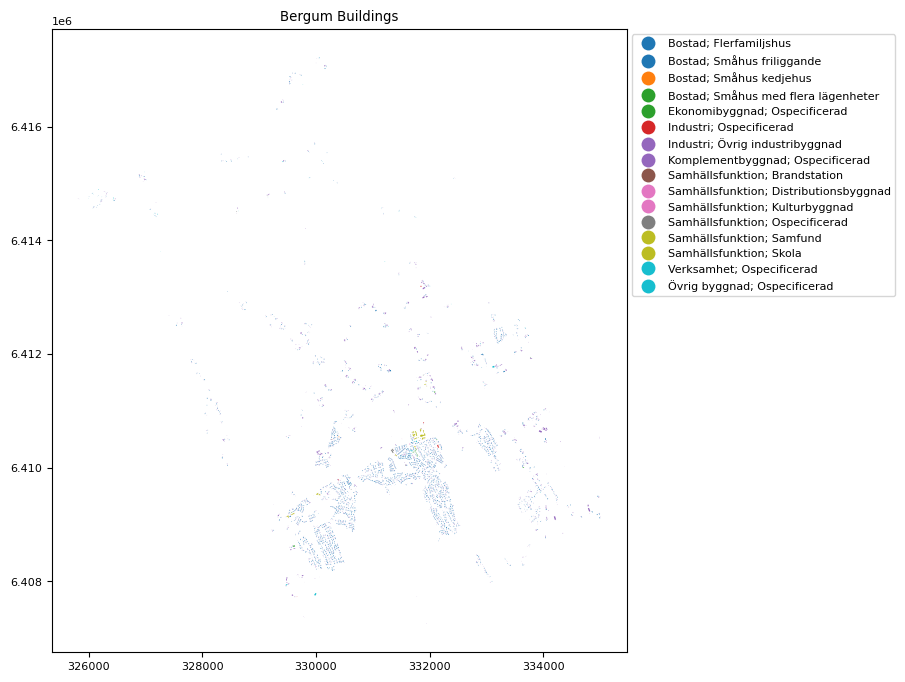

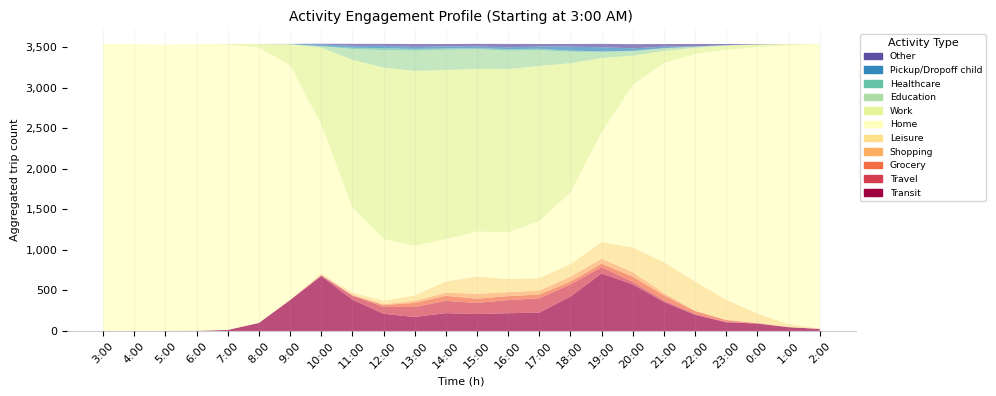

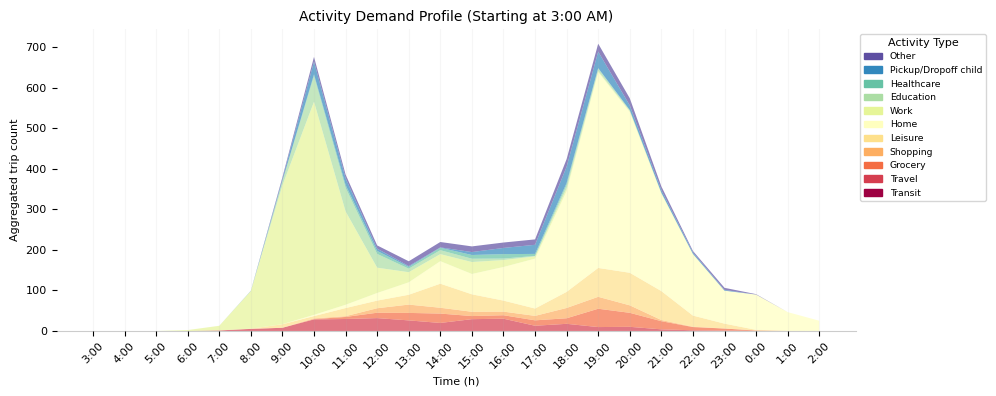

2024-05-15 11:27:50 - tripsender.population - INFO - Initializing Population object for year 2019 and area 612 Hjällbo
2024-05-15 11:27:50 - tripsender.population - INFO - [{'key': ['612 Hjällbo', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['612 Hjällbo', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['612 Hjällbo', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['612 Hjällbo', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['365']}, {'key': ['612 Hjällbo', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['612 Hjällbo', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['612 Hjällbo', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['612 Hjällbo', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key

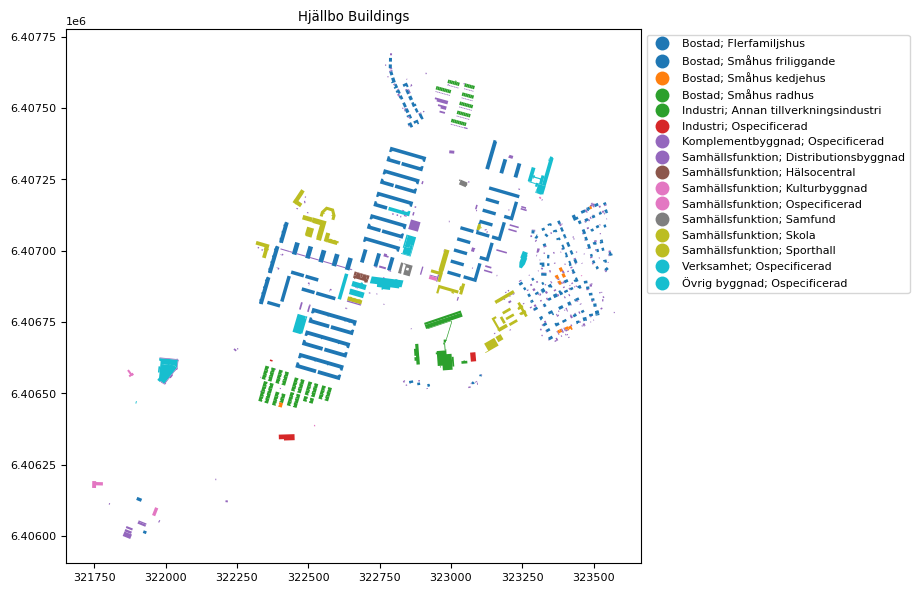

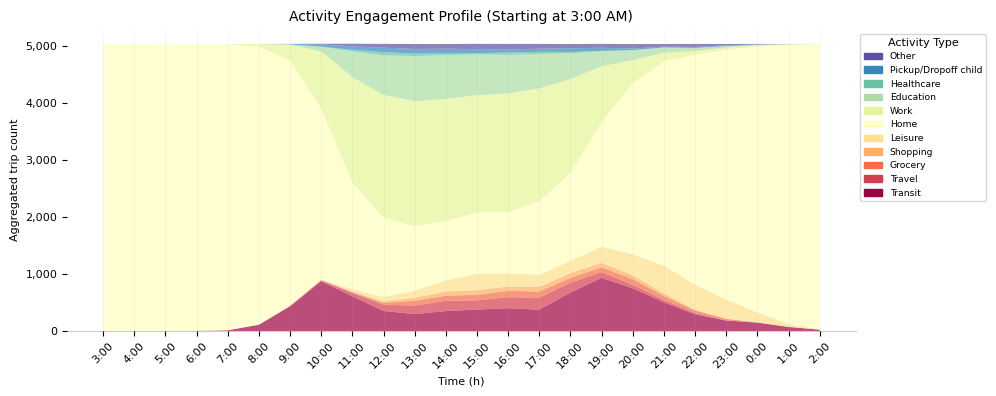

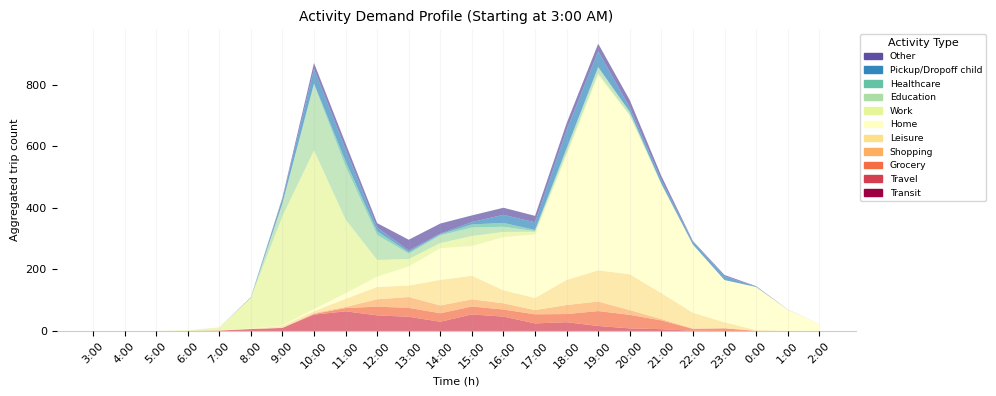

2024-05-15 11:31:43 - tripsender.population - INFO - Initializing Population object for year 2019 and area 613 Eriksbo
2024-05-15 11:31:43 - tripsender.population - INFO - [{'key': ['613 Eriksbo', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['613 Eriksbo', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['613 Eriksbo', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['613 Eriksbo', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['139']}, {'key': ['613 Eriksbo', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['613 Eriksbo', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['613 Eriksbo', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['613 Eriksbo', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key

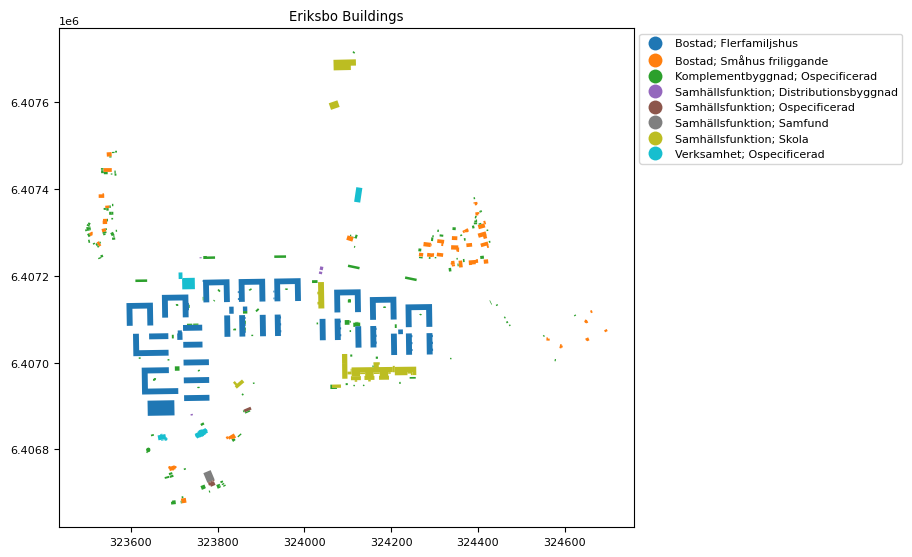

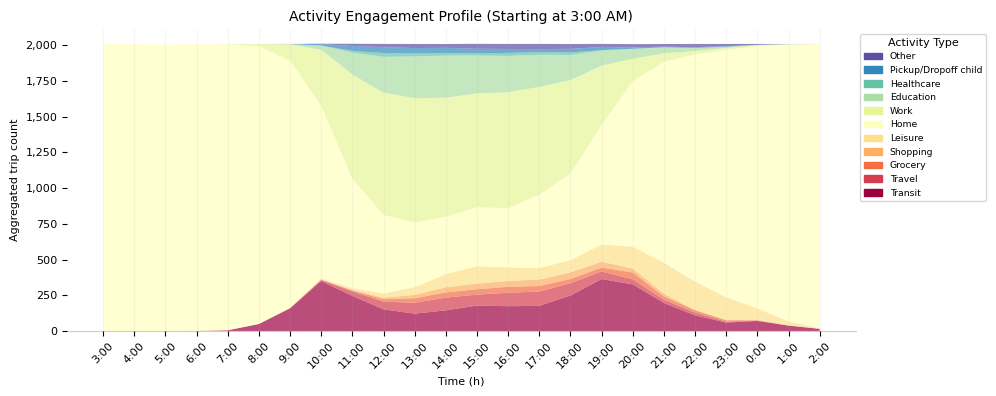

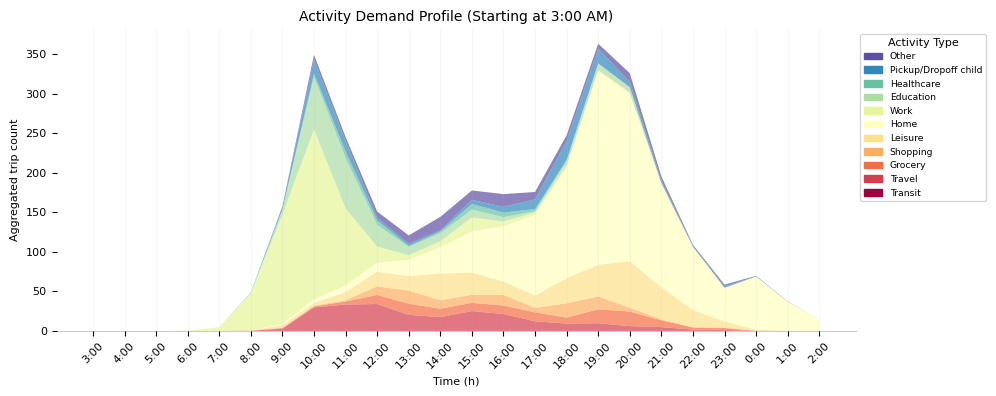

2024-05-15 11:33:19 - tripsender.population - INFO - Initializing Population object for year 2019 and area 701 Norra Biskopsgården
2024-05-15 11:33:19 - tripsender.population - INFO - [{'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['347']}, {'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['4']}, {'key': ['701 Norra Biskopsgården', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['701 Norra Biskop

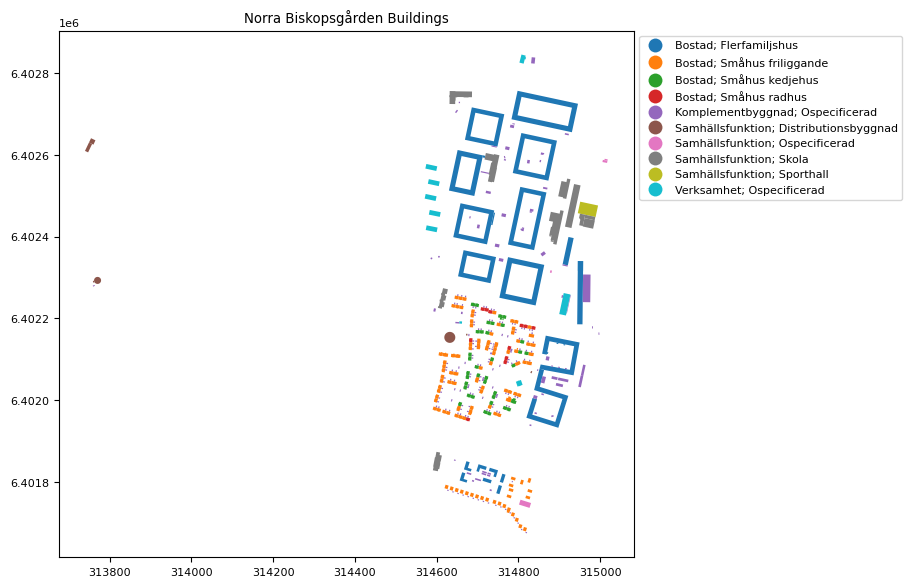

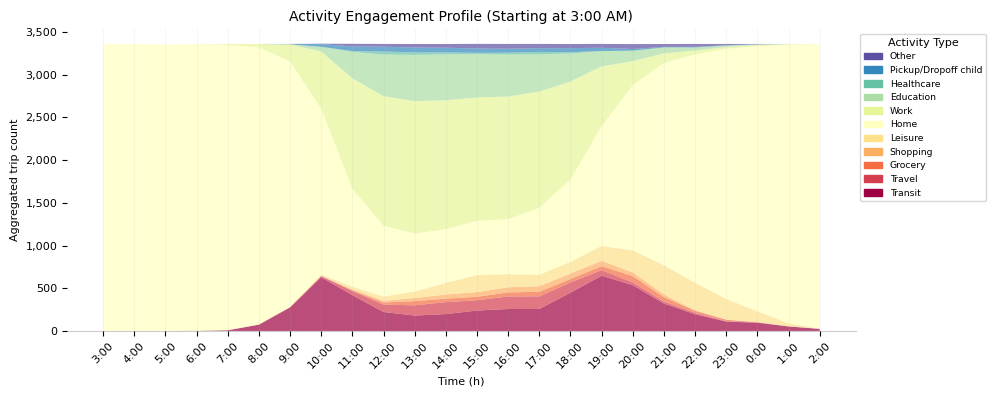

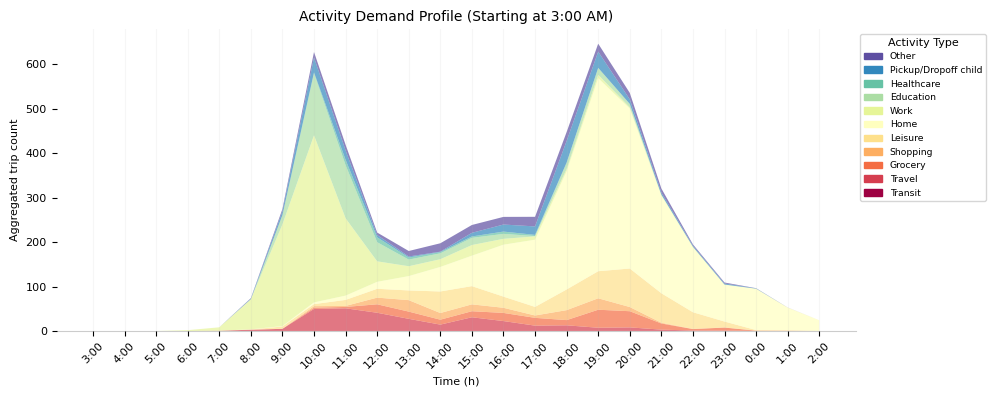

2024-05-15 11:35:28 - tripsender.population - INFO - Initializing Population object for year 2019 and area 702 Länsmansgården
2024-05-15 11:35:28 - tripsender.population - INFO - [{'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['316']}, {'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['702 Länsmansgården', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['702 Länsmansgården', '0-5 år', 'Kvinnor', 'Person i gift

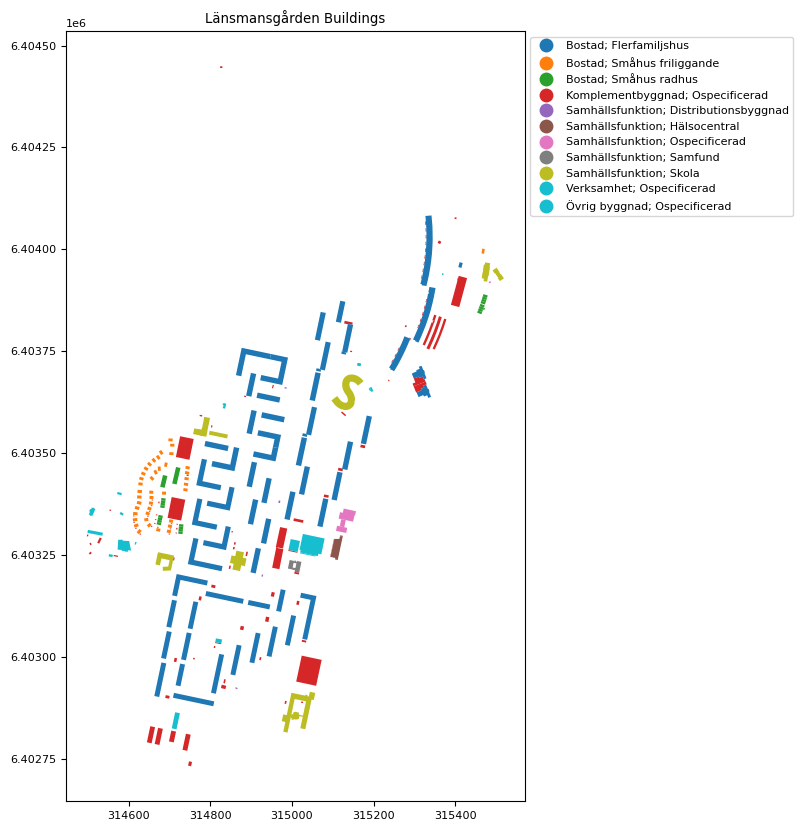

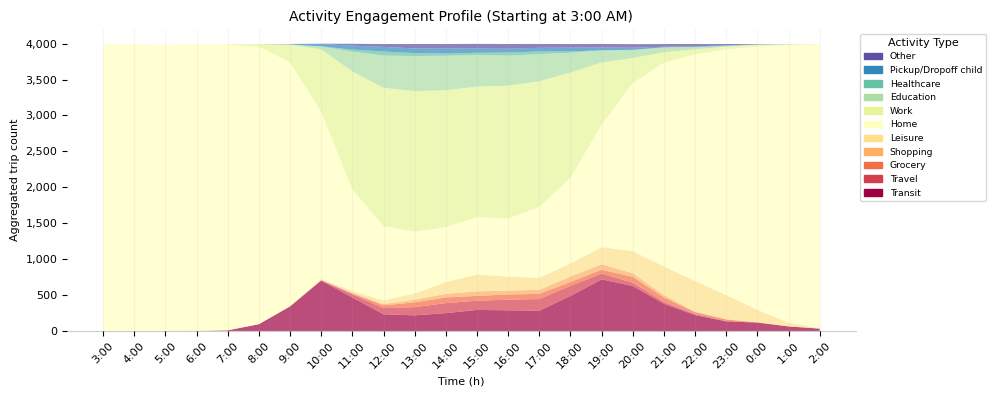

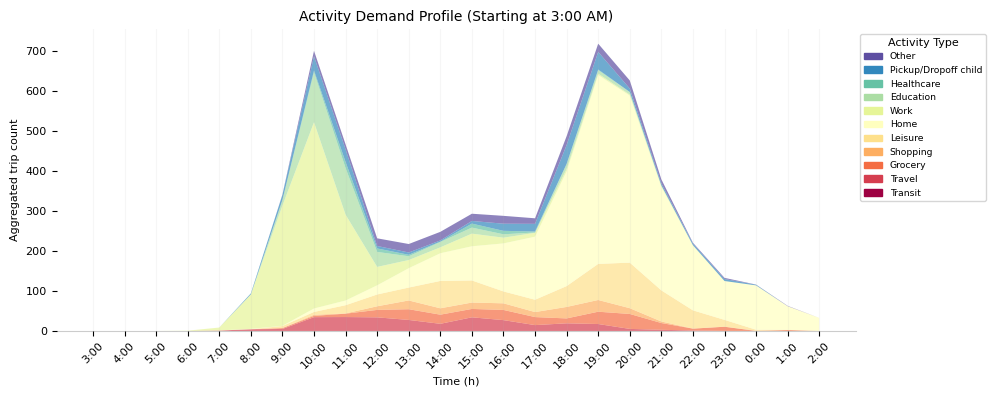

2024-05-15 11:37:50 - tripsender.population - INFO - Initializing Population object for year 2019 and area 703 Svartedalen
2024-05-15 11:37:50 - tripsender.population - INFO - [{'key': ['703 Svartedalen', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['703 Svartedalen', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['703 Svartedalen', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['703 Svartedalen', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['174']}, {'key': ['703 Svartedalen', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['703 Svartedalen', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['703 Svartedalen', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['703 Svartedalen', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerska

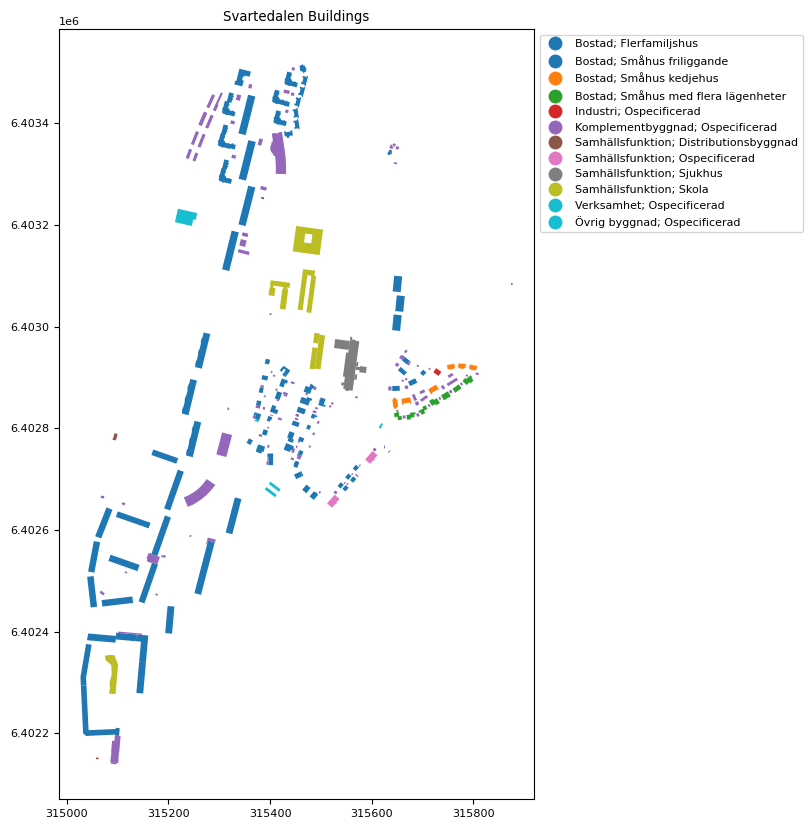

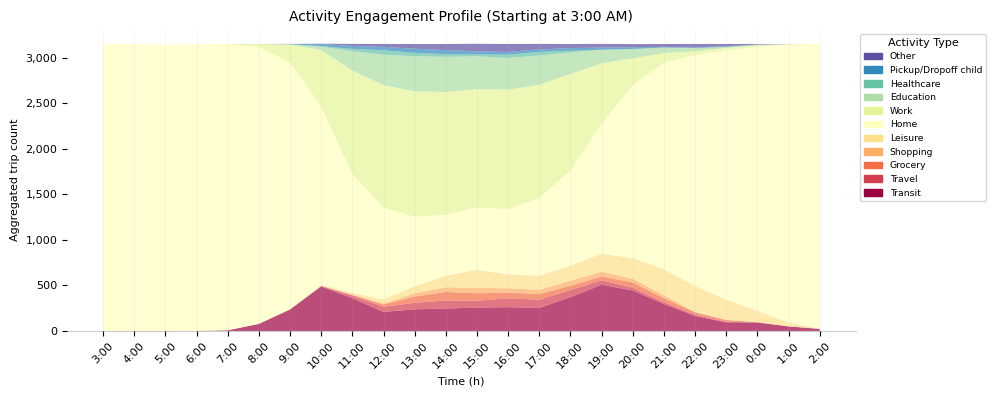

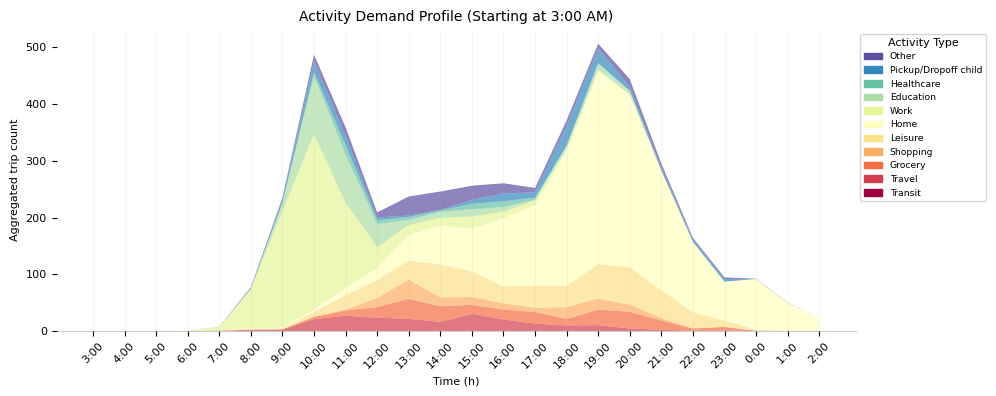

2024-05-15 11:39:53 - tripsender.population - INFO - Initializing Population object for year 2019 and area 704 Hjuvik
2024-05-15 11:39:53 - tripsender.population - INFO - [{'key': ['704 Hjuvik', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['704 Hjuvik', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['704 Hjuvik', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['704 Hjuvik', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['272']}, {'key': ['704 Hjuvik', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['704 Hjuvik', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['704 Hjuvik', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['704 Hjuvik', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['704 

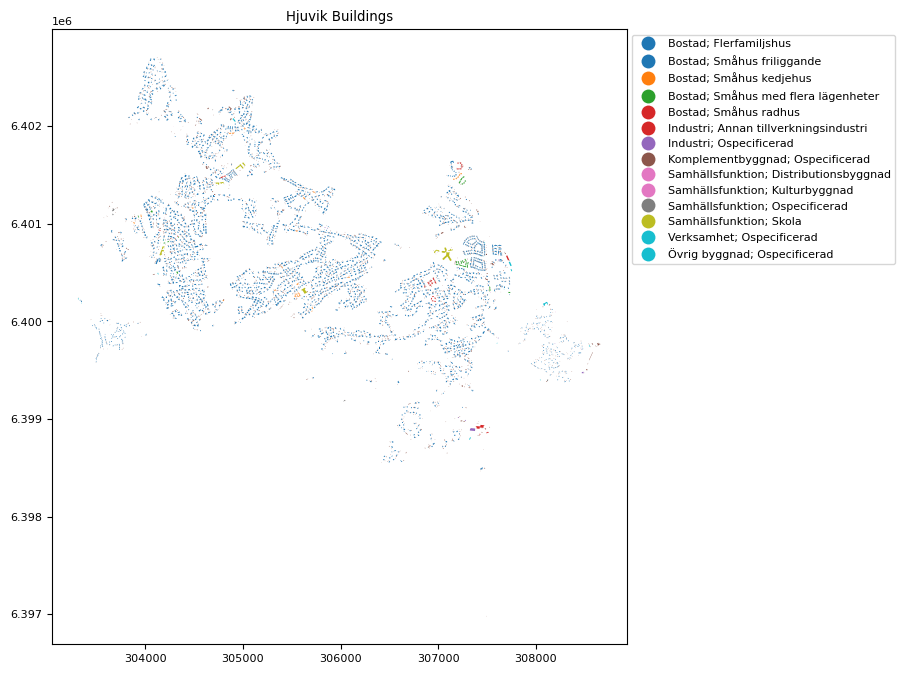

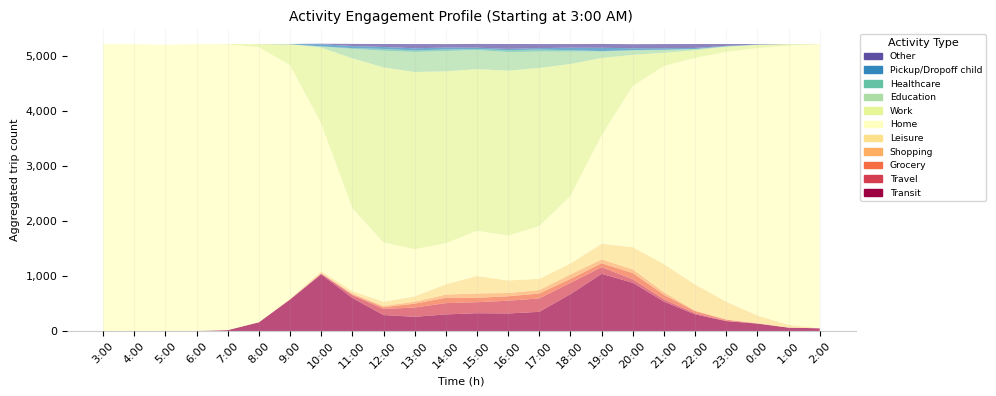

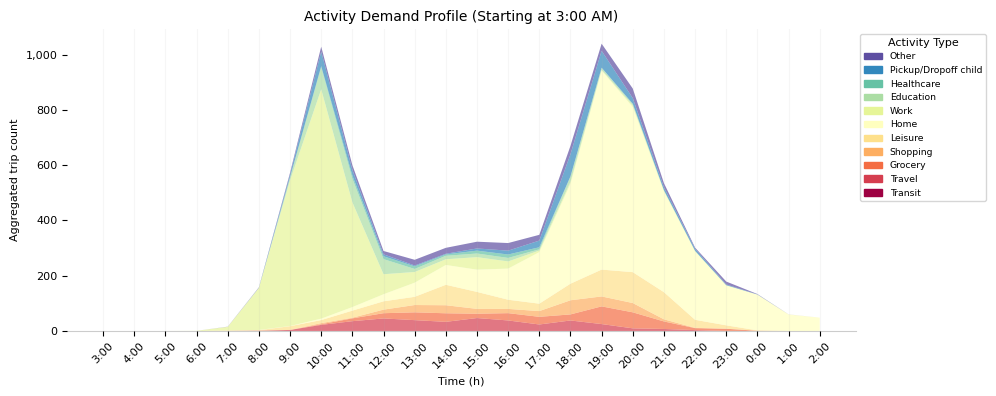

2024-05-15 11:47:09 - tripsender.population - INFO - Initializing Population object for year 2019 and area 705 Nolered
2024-05-15 11:47:09 - tripsender.population - INFO - [{'key': ['705 Nolered', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['705 Nolered', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['705 Nolered', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['705 Nolered', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['405']}, {'key': ['705 Nolered', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['705 Nolered', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['705 Nolered', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['705 Nolered', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key

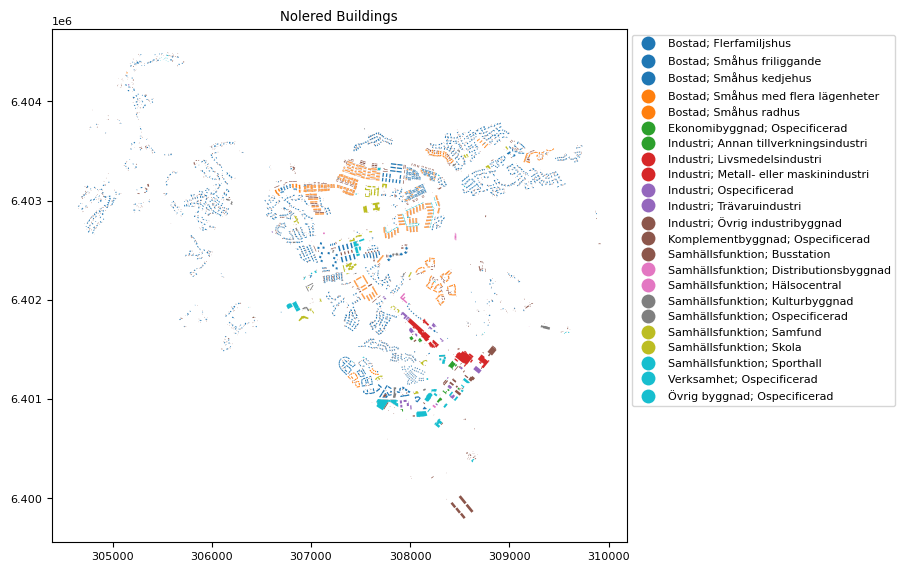

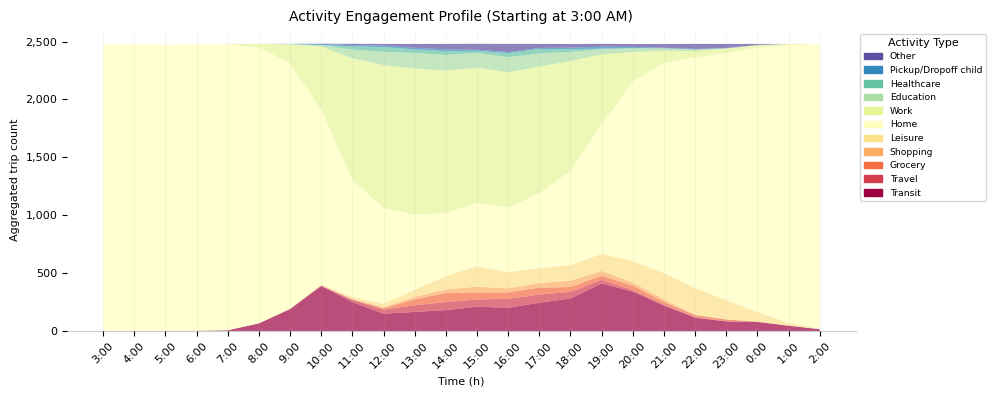

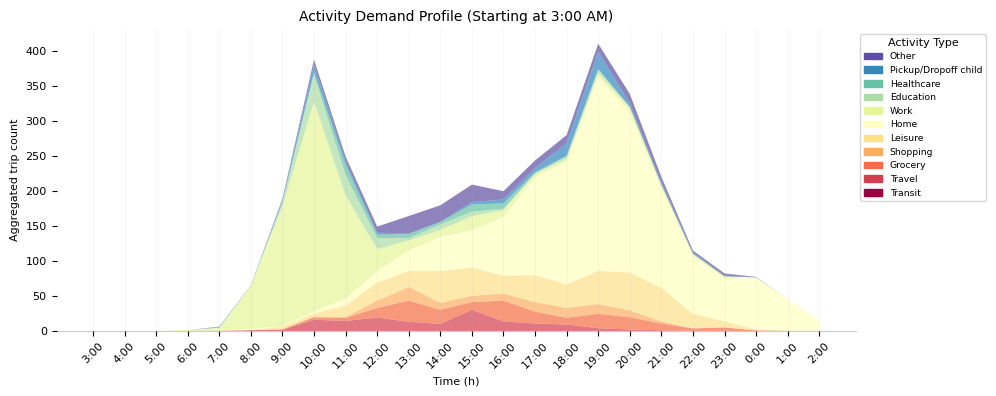

2024-05-15 11:50:28 - tripsender.population - INFO - Initializing Population object for year 2019 and area 706 Björlanda
2024-05-15 11:50:28 - tripsender.population - INFO - [{'key': ['706 Björlanda', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['706 Björlanda', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['706 Björlanda', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['706 Björlanda', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['383']}, {'key': ['706 Björlanda', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['706 Björlanda', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['706 Björlanda', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['706 Björlanda', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'valu

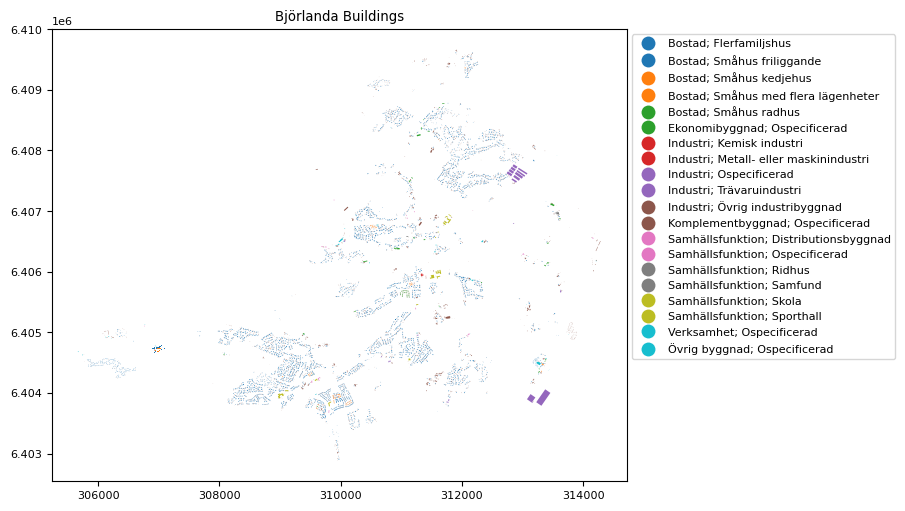

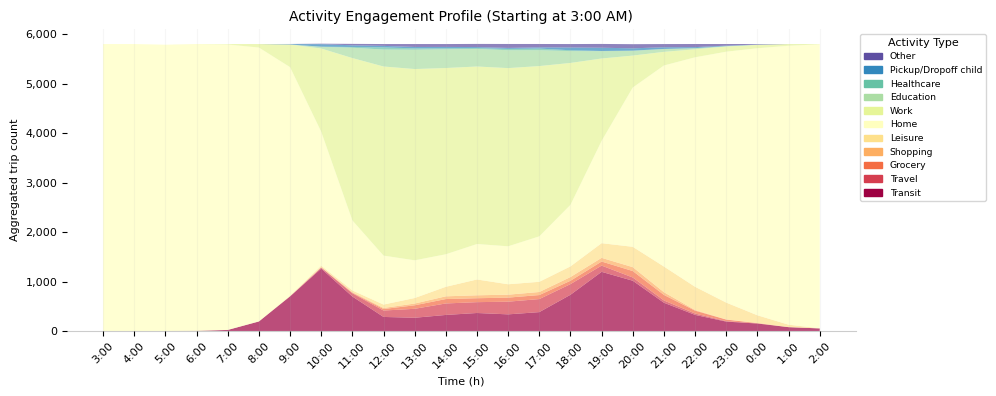

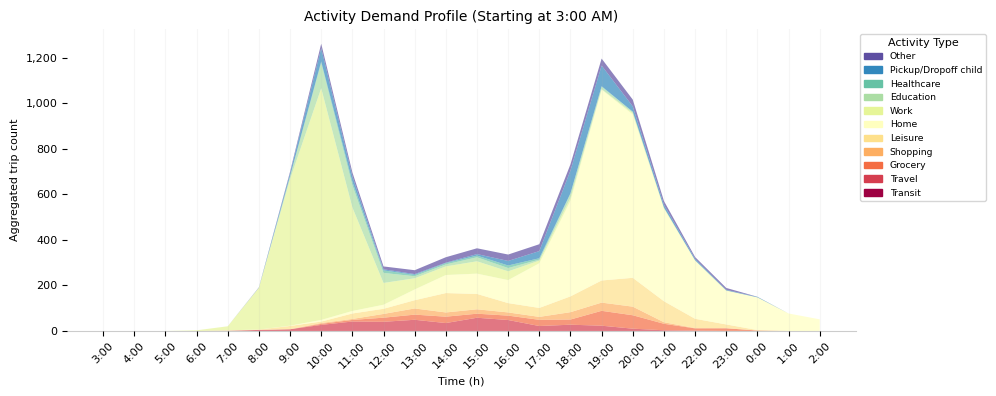

2024-05-15 11:54:37 - tripsender.population - INFO - Initializing Population object for year 2019 and area 707 Arendal
2024-05-15 11:54:37 - tripsender.population - INFO - [{'key': ['707 Arendal', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['707 Arendal', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key':

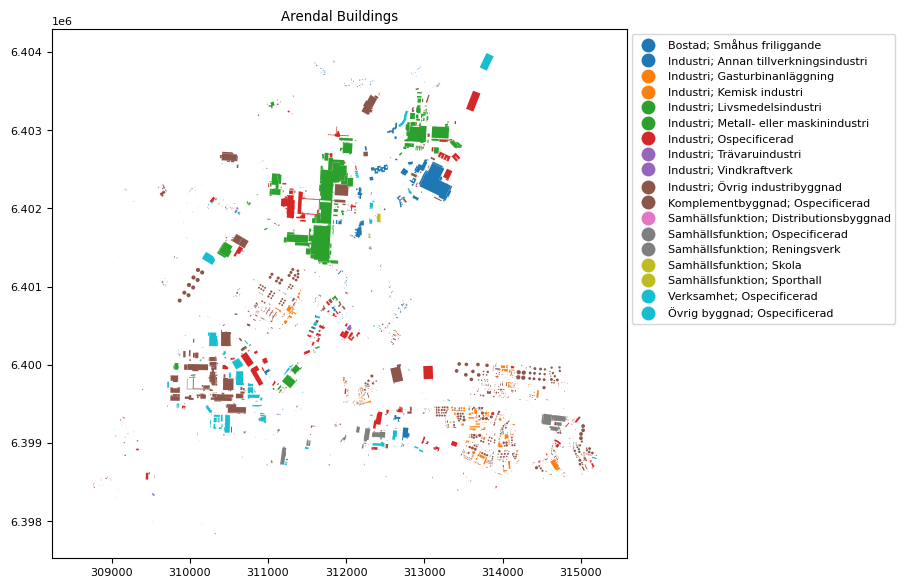

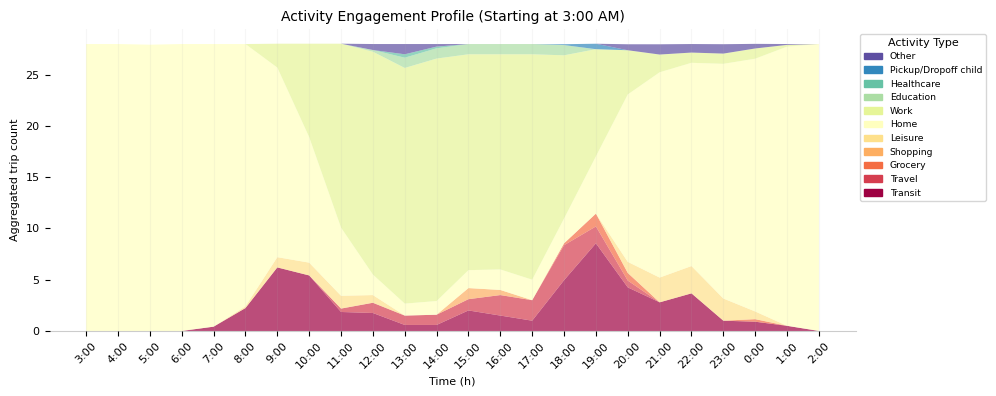

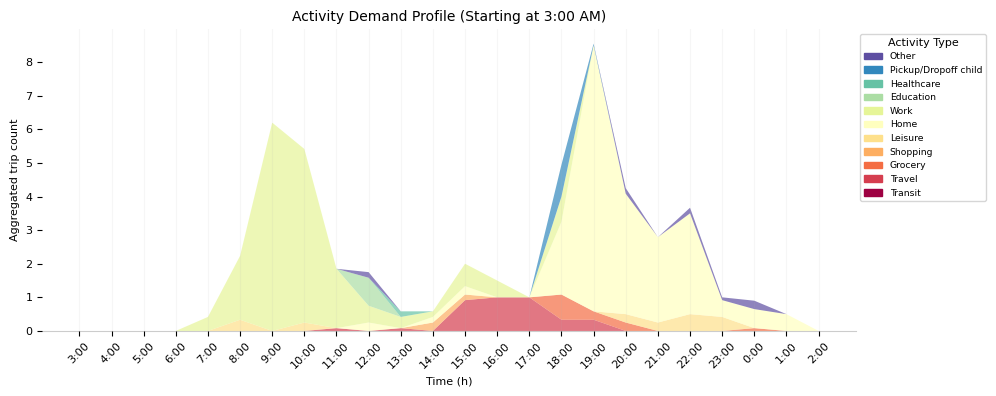

2024-05-15 11:54:48 - tripsender.population - INFO - Initializing Population object for year 2019 and area 708 Södra Biskopsgården
2024-05-15 11:54:48 - tripsender.population - INFO - [{'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['383']}, {'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['708 Södra Biskopsgården', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['708 Södra Biskop

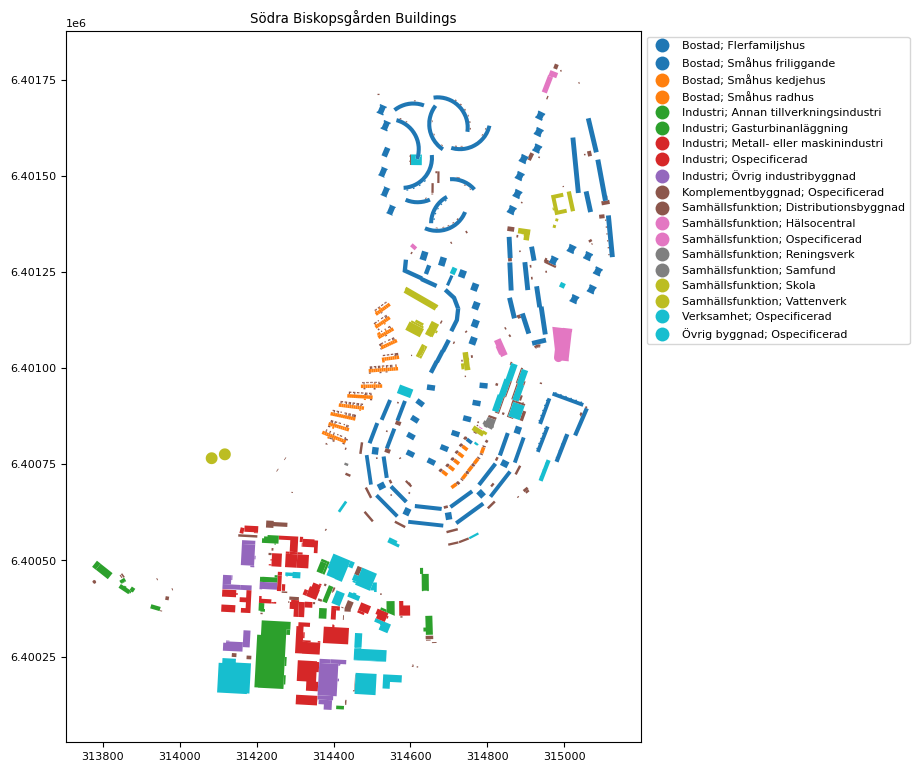

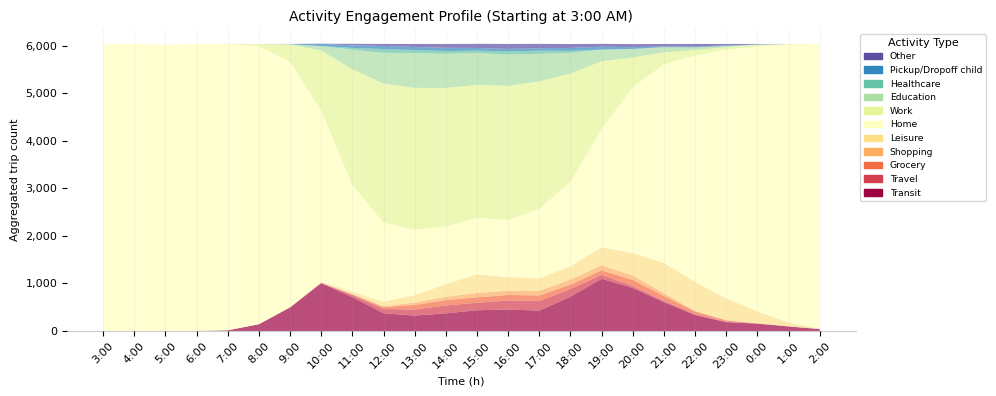

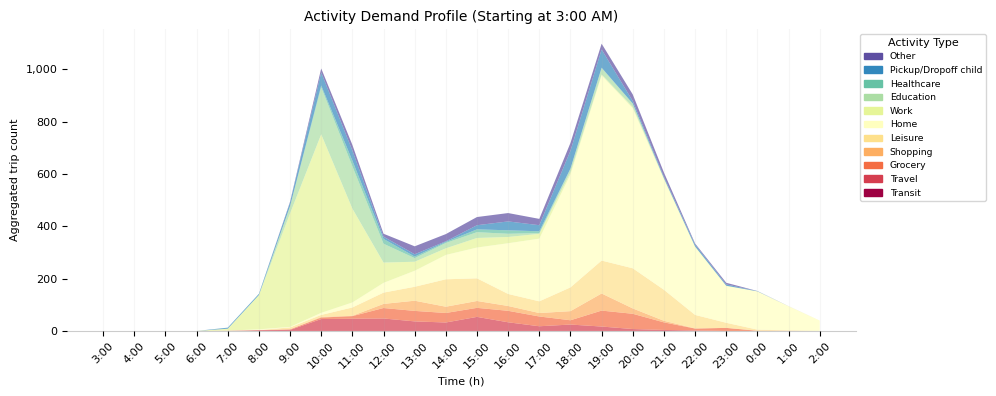

2024-05-15 11:58:35 - tripsender.population - INFO - Initializing Population object for year 2019 and area 709 Jättesten
2024-05-15 11:58:35 - tripsender.population - INFO - [{'key': ['709 Jättesten', '0-5 år', 'Män', 'Person i gift par/registrerat partnerskap', '2019'], 'values': ['0']}, {'key': ['709 Jättesten', '0-5 år', 'Män', 'Personer i samboförhållande', '2019'], 'values': ['0']}, {'key': ['709 Jättesten', '0-5 år', 'Män', 'Ensamstående förälder', '2019'], 'values': ['0']}, {'key': ['709 Jättesten', '0-5 år', 'Män', 'Barn', '2019'], 'values': ['220']}, {'key': ['709 Jättesten', '0-5 år', 'Män', 'Ensamboende', '2019'], 'values': ['0']}, {'key': ['709 Jättesten', '0-5 år', 'Män', 'Ej ensamboende personer, övriga', '2019'], 'values': ['0']}, {'key': ['709 Jättesten', '0-5 år', 'Män', 'Uppgift saknas (inkl. På kommunen skriven och Utan känt hemvist)', '2019'], 'values': ['0']}, {'key': ['709 Jättesten', '0-5 år', 'Kvinnor', 'Person i gift par/registrerat partnerskap', '2019'], 'valu

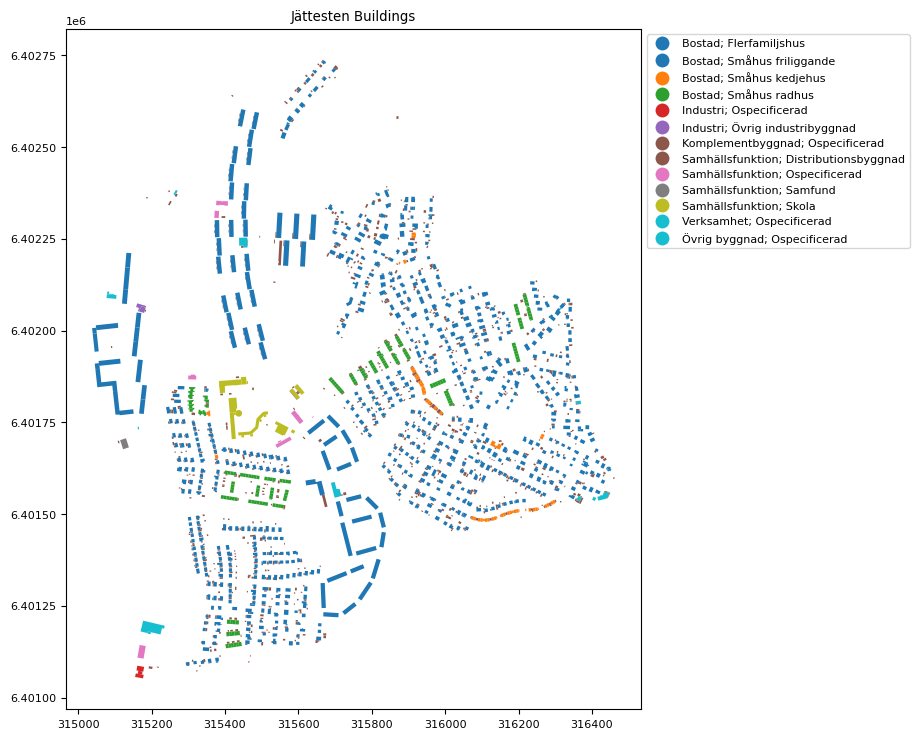

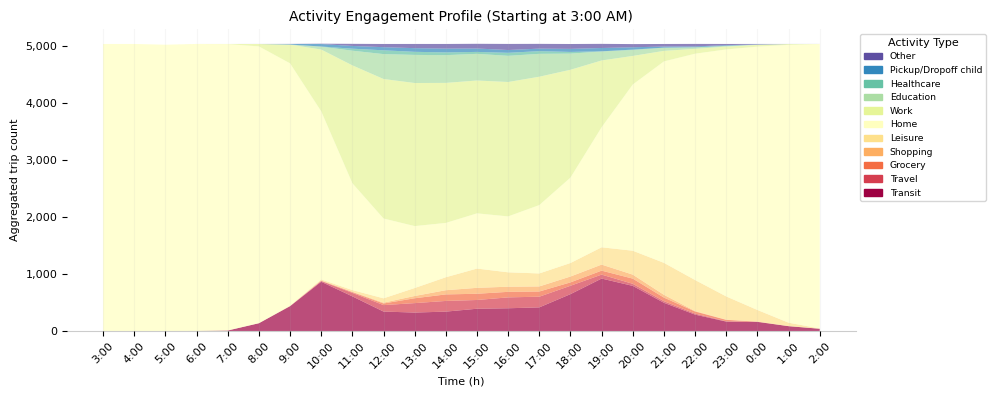

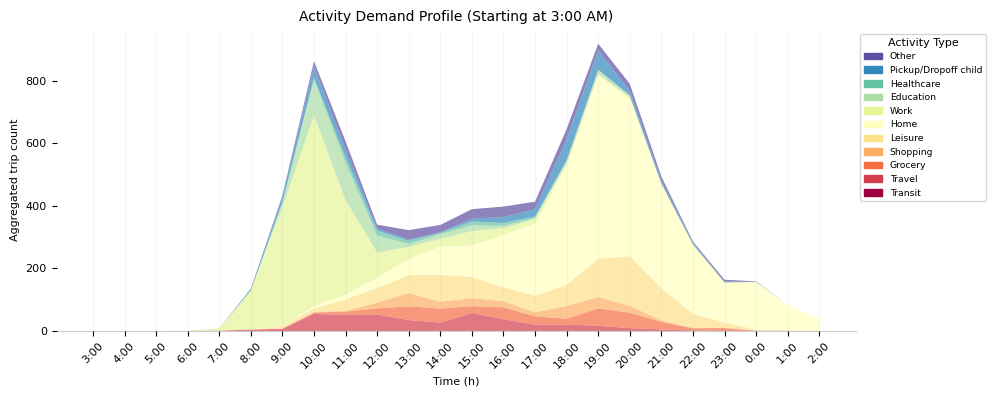

In [10]:

# 30 is Gamlestaden
for area in primary_areas[67:]:
    area = utils.search_primary_area(area)
    gdf_building = od.get_gdf(area = area,
                    feature = 1,
                    KEY = ['andamal_1t','height'],
                    VAL = None,
                    title = 'Buildings',
                    filter = False,
                    local = False,
                    web = False,
                    plot = True)


    # Process residential buildings
    gdf_residential = od.process_residential_buildings(gdf_building)

    # Create a population object
    population = Population(year, area)

    # Create persons from the population object
    synthpop.generate_persons(population)

    # Create households from the population object
    synthpop.synthesise_population(population, age_split=45, min_age_of_parent=20)

    # Instantiating the building class
    Building.instantiate_buildings(gdf_residential)

    # Assigning households to buildings
    od.assign_households_to_buildings(gdf_residential)

    # Assign workers to buildings
    location_assignment.assign_workers_to_buildings()

    # Turn tripsender Building instances into a GeoDataFrame
    gdf_homes = Building.return_gdf()

    # Call the function
    gdf_worker_jobs_result = location_assignment.gravity_model_simulation(gdf_homes, gdf_jobs, density_weight=2,  distance_decay=0.5, plot=False)

    # Assign preferred locations
    location_assignment.compute_preferred_locations()

    # Assign activity sequences
    assign_activity_sequence_to_synthetic_population()

    # Generate od matrix
    od_matrix = od.generate_od_matrix()

    # Compute routes
    od_matrix.compute_routes(nrc_drive, nrc_bike, nrc_walk, nrc_transit)

    # Write synthpop to database
    io.write_to_database(area, year, od_matrix)

    plot_activity_engagement(area,od_matrix.activity_sequences)
    plot_amenity_demand(area, od_matrix.activity_sequences)

    # Clear all instances for the next iteration
    utils.clear_instances()